In [ ]:
# #   leggo il csv
# Con il tuo DataFrame puoi fare:

# Raggruppamenti con groupby() per osservare metriche aggregate per Division, Settimana, ecc.
# Analisi temporali per osservare come le metriche cambiano nel tempo.
# Analisi delle correlazioni per scoprire relazioni tra metriche.
# Calcoli di metriche derivate (come percentuali, rapporti, conversion rate).
# Analisi con condizioni specifiche (filtraggio).
# Visualizzazioni per ottenere una panoramica chiara dei dati
# #   

# Calcolare e mostrare grafici di vendite togliendo i casi superflui, ossia
#   prendere il primo e secondo picco ed analizzarlo senza valori superflui
#   così da trovare effettivamente quanto impattano le singole colonne sulla colonna sales
#   tramite la differenza di proporzione
#   possiamo analizzare le Sales in base ai gruppi


# L'analisi di questo set di dati poteva finire con un solo grafico, quello di correlazione,
# data la mancanza di dati abbastanza importanti, come il costo e la quantità settimanale per gererare ogni engagment, ma per avvalorare e mostrare la mia tesi, ho creato molti altri grafici

# Purtroppo questo set di dati pecca nella spiegazione delle rispettive colonne
# Tipo di piattaforma
# Tipo di contenuto
# Tipo di pubblicità

# Data la mancanza di questi dati, si può completare l'analisi dicendo che ci sono delle correlazioni molto forti tra le vendite e [lista di impressions]
# e tra specifici gruppi [lista dei gruppi e proporzione sulle vendite date dal gruppo]

### Importo le librerie

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# Impostare Pandas per visualizzare l'output completo
pd.set_option('display.max_columns', None)  # Mostra tutte le colonne
pd.set_option('display.width', 1000)  # Imposta una larghezza complessiva maggiore
pd.set_option('display.max_rows', None)  # Mostra tutte le righe

Creo un dataframe leggendo il file csv

In [2]:
df = pd.read_csv('Sample Media Spend Data.csv')

df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'], errors='coerce')
df['Month'] = df['Calendar_Week'].dt.month_name()

df_columns = df.columns
# Ordinare il DataFrame in ordine crescente in base alla colonna 'data'
#df = df.sort_values(by='Calendar_Week').reset_index(drop=True)
# Converti tutte le colonne in numeri, se possibile
#df_converted = df.apply(pd.to_numeric, errors='coerce')
df1 = df.loc[:,df_columns[2:10]]
df.head()

,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Month
0,A,2018-01-06,392,422,408,349895.0107,73580,12072,682,59417,January
1,A,2018-01-13,787,904,110,506270.2176,11804,9499,853,56806,January
2,A,2018-01-20,81,970,742,430042.1538,52232,17048,759,48715,January
3,A,2018-01-27,25,575,65,417745.6658,78640,10207,942,72047,January
4,A,2018-02-03,565,284,295,408505.8012,40561,5834,658,56235,February


### Creo una funzione che mi smista le colonne colonne numeriche da quelle categoriche

In [3]:
def get_num_cat_columns(df):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num = df.select_dtypes(include=numerics).columns.to_list()
    cat = df.select_dtypes(include=['object', 'datetime']).columns.to_list()
    return num, cat

numeric_columns, categorical_columns  = get_num_cat_columns(df)
numeric_columns, categorical_columns

(['Paid_Views',
  'Organic_Views',
  'Google_Impressions',
  'Email_Impressions',
  'Facebook_Impressions',
  'Affiliate_Impressions',
  'Overall_Views',
  'Sales'],
 ['Division', 'Calendar_Week', 'Month'])

In [ ]:
#df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'])

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Division               3051 non-null   object        
 1   Calendar_Week          3051 non-null   datetime64[ns]
 2   Paid_Views             3051 non-null   int64         
 3   Organic_Views          3051 non-null   int64         
 4   Google_Impressions     3051 non-null   int64         
 5   Email_Impressions      3051 non-null   float64       
 6   Facebook_Impressions   3051 non-null   int64         
 7   Affiliate_Impressions  3051 non-null   int64         
 8   Overall_Views          3051 non-null   int64         
 9   Sales                  3051 non-null   int64         
 10  Month                  3051 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(7), object(2)
memory usage: 262.3+ KB


In [5]:
df.isnull().sum()

Division                 0
Calendar_Week            0
Paid_Views               0
Organic_Views            0
Google_Impressions       0
Email_Impressions        0
Facebook_Impressions     0
Affiliate_Impressions    0
Overall_Views            0
Sales                    0
Month                    0
dtype: int64

In [6]:
# Restituisce il numero totale di righe duplicate
df.duplicated().sum()

# Se ci fossero stai dei duplicati sarebbero stati tolti con
#df = df.drop_duplicates(ignore_index=True)

0

In [7]:
df1.describe().round(2)
#df1.columns

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
count,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.0
mean,15093.94,13355.67,886173.83,760509.38,269126.89,22910.90,27980.91,185901.4
std,30785.88,24079.40,1355075.82,626014.12,466511.67,21617.64,52054.98,232207.9
min,1.00,1.00,7.00,40894.45,29.00,910.00,2.00,15436.0
25%,537.00,712.50,169828.00,378496.92,57073.50,9127.00,747.00,73393.5
50%,2699.00,4110.00,490531.00,590970.80,127523.00,16658.00,7879.00,113573.0
75%,17358.00,16230.50,1022621.50,962246.61,283505.00,27486.50,34111.50,202975.5
max,518190.00,270453.00,17150439.00,7317730.25,7558435.00,175791.00,635057.00,3575430.0


In [8]:
df1.corr().round(2)

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
Paid_Views,1.00,0.80,0.31,0.29,0.32,0.22,0.96,0.29
Organic_Views,0.80,1.00,0.43,0.34,0.41,0.23,0.93,0.39
Google_Impressions,0.31,0.43,1.00,0.64,0.73,0.35,0.38,0.78
Email_Impressions,0.29,0.34,0.64,1.00,0.52,0.70,0.33,0.75
Facebook_Impressions,0.32,0.41,0.73,0.52,1.00,0.29,0.38,0.75
Affiliate_Impressions,0.22,0.23,0.35,0.70,0.29,1.00,0.23,0.44
Overall_Views,0.96,0.93,0.38,0.33,0.38,0.23,1.00,0.35
Sales,0.29,0.39,0.78,0.75,0.75,0.44,0.35,1.00


In [6]:
df.columns[1:-1]

Index(['Calendar_Week', 'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views', 'Sales'], dtype='object')

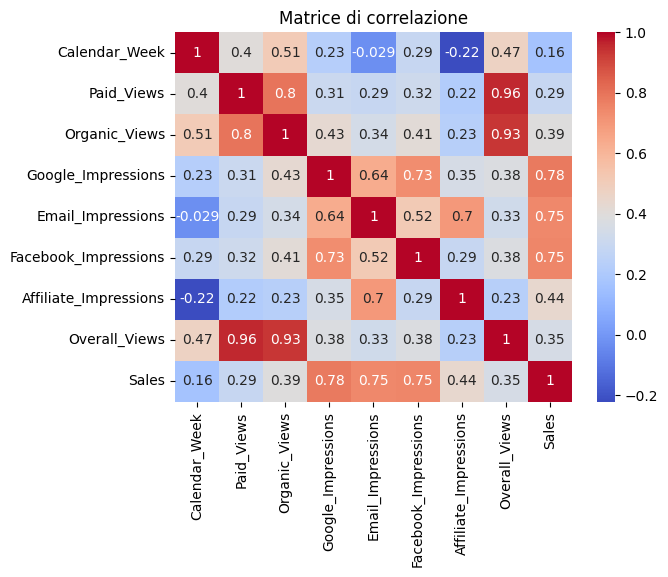

In [ ]:
#plt.figure(figsize=(20,10))
#sns.heatmap(df1.corr(), annot=True, cmap='coolwarm', fmt=".2f", center=0)
sns.heatmap(df1.corr(), annot=True, cmap="coolwarm")
#sns.heatmap(df[df.columns[1:-1]].corr(), annot=True, cmap="coolwarm")
plt.title('Matrice di correlazione')
plt.show()

In [30]:
colonne[:-1]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

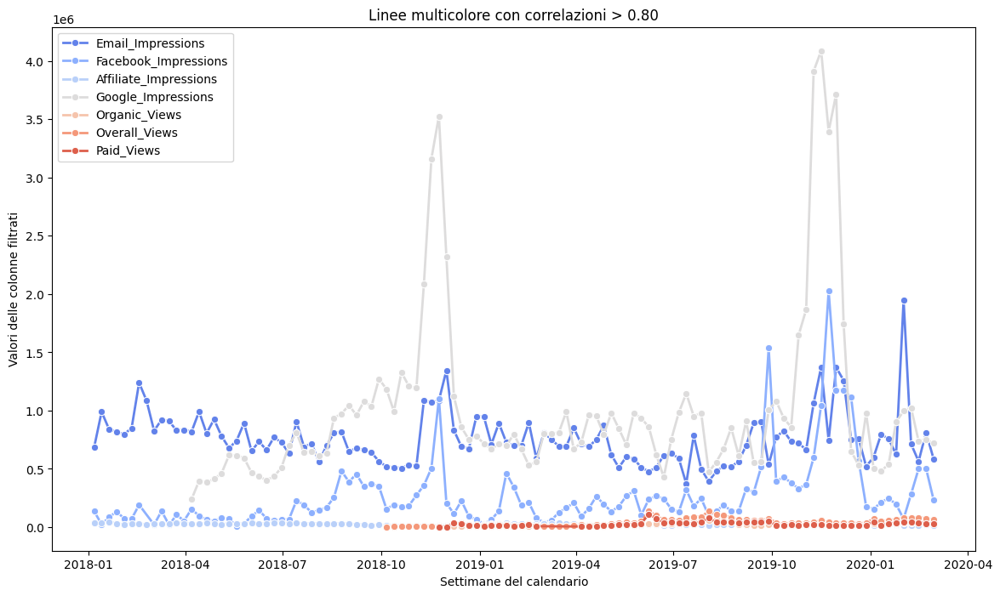

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

colonne = df.columns[2:9]  # Selezionare le colonne numeriche di interesse

# Creare una struttura con dati filtrati per la correlazione > 0.8
filtered_data = []

for week in df['Calendar_Week'].unique():
    weekly_df = df[df['Calendar_Week'] == week]
    
    # Calcola la correlazione per ciascun fattore con Sales
    weekly_corr = weekly_df[colonne].corrwith(weekly_df['Sales']).dropna()
    
    # Filtrare solo le colonne con correlazione maggiore di 0.80
    for col in weekly_corr.index:
        if abs(weekly_corr[col]) > 0.6:  # Considerare solo correlazioni assolute > 0.8
            filtered_data.append({
                "week": week,
                "column": col,
                "correlation": weekly_corr[col],
                "value": weekly_df[col].mean()  # Valore medio per ciascun fattore
            })

# Convertire la lista in un DataFrame
filtered_df = pd.DataFrame(filtered_data)

# Creare il grafico con la linea multicolore
plt.figure(figsize=(14, 8))

# Creare la linea multicolore con hue basato sulle colonne
sns.lineplot(
    data=filtered_df,
    x="week",
    y="value",
    hue="column",
    palette="coolwarm",
    marker="o",
    linewidth=2
)

plt.xlabel('Settimane del calendario')
plt.ylabel('Valori delle colonne filtrati')
plt.title('Linee multicolore con correlazioni > 0.80')
plt.legend()
plt.show()


In [10]:
df.columns[2:10]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views', 'Sales'], dtype='object')

In [45]:
import pandas as pd
import plotly.express as px
from matplotlib import colors as mcolors

colonne = df.columns[2:9]  # Selezionare le colonne numeriche di interesse

# Creare una struttura con dati filtrati per la correlazione > 0.8
filtered_data = []

for week in df['Calendar_Week'].unique():
    weekly_df = df[df['Calendar_Week'] == week]
    weekly_corr = weekly_df[colonne].corrwith(weekly_df['Sales']).dropna()
    
    for col in weekly_corr.index:
        if abs(weekly_corr[col]) > 0.65:  # Filtraggio correlazioni > 0.8
            filtered_data.append({
                "week": week,
                "column": col,
                "value": weekly_df[col].mean(),
                "correlation": weekly_corr[col]
            })

filtered_df = pd.DataFrame(filtered_data)

# Calcolare l'andamento settimanale delle vendite
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()

# Creare il grafico principale
fig = px.line(
    filtered_df,
    x="week",
    y="value",
    color="column",
    hover_data=["correlation"]
)

# Aggiungere la linea delle vendite al grafico
fig.add_scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["Sales"],
    mode="lines+markers",
    name="Vendite",
    line=dict(color="black", dash="dash"),
    hoverinfo="x+y",
    marker=dict(size=6)
)

# Ridurre la luminosità dei marker delle correlazioni
for trace in fig.data:
    if trace.mode == "lines":
        darkened_marker_color = mcolors.to_rgba(trace.line.color, 0.6)  # Scurire il marker
        trace.update(marker=dict(size=6, color=darkened_marker_color))

# Aggiornare layout
fig.update_layout(
    title="Correlazioni > 0.8 con Marker Scuri e Grafico Vendite",
    xaxis_title="Settimane del calendario",
    yaxis_title="Valori delle colonne filtrati",
)

fig.show()


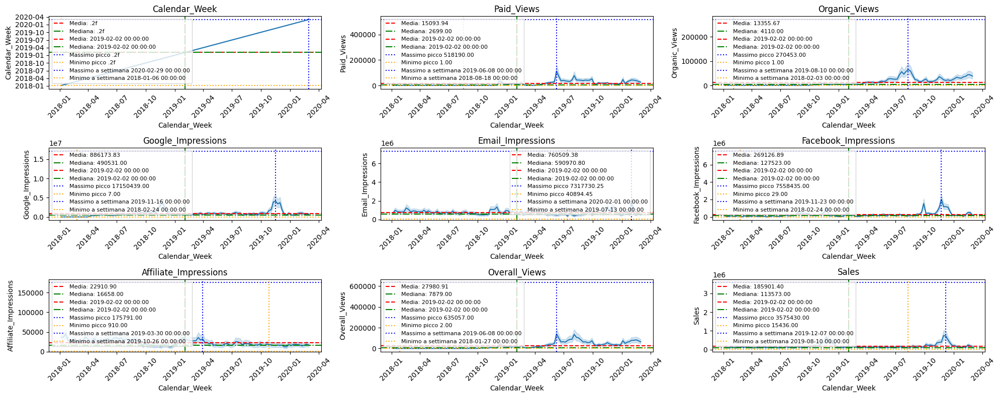

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare il minimo e massimo per il singolo grafico
            y_min = df[colonne[idx]].min()
            y_max = df[colonne[idx]].max()

            # Trovare le posizioni x del massimo e minimo
            x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']

            # Disegnare il grafico con la sua scala
            sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
            axes[row, col].set_title(f'{colonne[idx]}')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Aggiungere la media della y
            mean_yvalue = df[colonne[idx]].mean()
            axes[row, col].axhline(mean_yvalue, color='red', linestyle='--', label=f'Media: {mean_yvalue:.2f}')

            # Aggiungere la mediana della y
            median_yvalue = df[colonne[idx]].median()
            axes[row, col].axhline(median_yvalue, color='green', linestyle='-.', label=f'Mediana: {median_yvalue:.2f}')

            # Aggiungere la media
            mean_xvalue = df['Calendar_Week'].mean()
            axes[row, col].axvline(mean_xvalue, color='red', linestyle='--', label=f'Media: {mean_xvalue}')

            # Aggiungere la mediana
            median_xvalue = df['Calendar_Week'].median()
            axes[row, col].axvline(median_xvalue, color='green', linestyle='-.', label=f'Mediana: {median_xvalue}')

            # Disegnare la linea del massimo picco con axhline
            axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Massimo picco {y_max:.2f}')

            # Disegnare la linea del minimo picco con axhline
            axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Minimo picco {y_min:.2f}')

            # Aggiungere una axvline al massimo
            axes[row, col].axvline(x=x_max, color='blue', linestyle=':', label=f'Massimo a settimana {x_max}')

            # Aggiungere una axvline al minimo
            axes[row, col].axvline(x=x_min, color='orange', linestyle=':', label=f'Minimo a settimana {x_min}')

            # Aggiungere una legenda
            axes[row, col].legend(fontsize=8)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


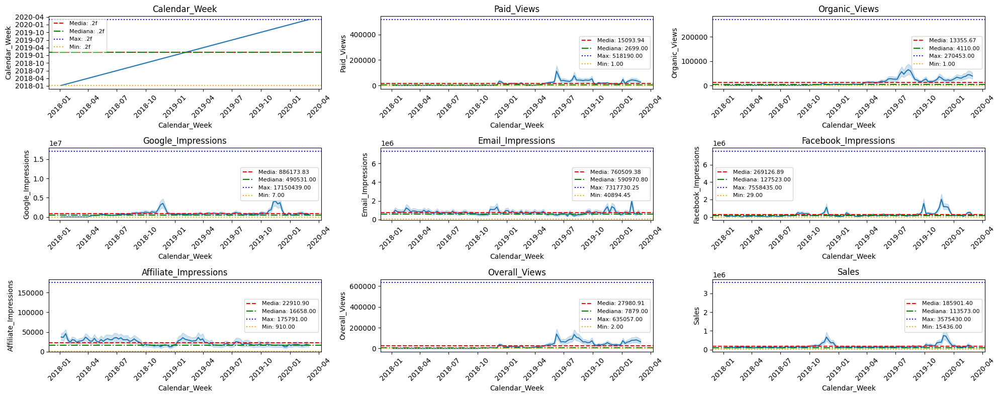

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare il minimo e massimo per il singolo grafico
            y_min = df[colonne[idx]].min()
            y_max = df[colonne[idx]].max()

            # Disegnare il grafico con la sua scala
            sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
            axes[row, col].set_title(f'{colonne[idx]}')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Aggiungere la media della y
            mean_yvalue = df[colonne[idx]].mean()
            axes[row, col].axhline(mean_yvalue, color='red', linestyle='--', label=f'Media: {mean_yvalue:.2f}')

            # Aggiungere la mediana della y
            median_yvalue = df[colonne[idx]].median()
            axes[row, col].axhline(median_yvalue, color='green', linestyle='-.', label=f'Mediana: {median_yvalue:.2f}')

            # Disegnare la linea del massimo picco con axhline
            axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Max: {y_max:.2f}')

            # Disegnare la linea del minimo picco con axhline
            axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Min: {y_min:.2f}')

            # Aggiungere una legenda
            axes[row, col].legend(fontsize=8)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


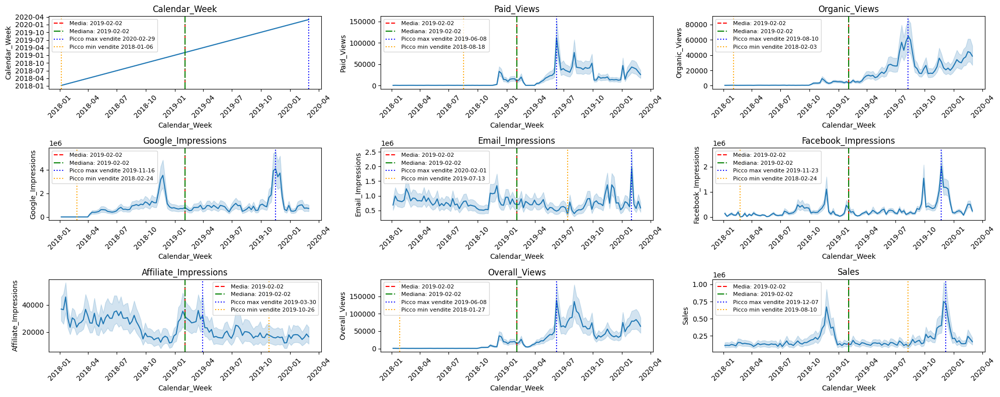

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare il minimo e massimo per il singolo grafico

            # Trovare le posizioni x del massimo e minimo
            p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']

            #x_max = df['Calendar_Week'].max()
            #x_min = df['Calendar_Week'].min()
            

            # Disegnare il grafico con la sua scala
            sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
            axes[row, col].set_title(f'{colonne[idx]}')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Aggiungere la media
            mean_xvalue = df['Calendar_Week'].mean()
            axes[row, col].axvline(mean_xvalue, color='red', linestyle='--', label=f'Media: {str(mean_xvalue)[:10]}')

            # Aggiungere la mediana
            median_xvalue = df['Calendar_Week'].median()
            axes[row, col].axvline(median_xvalue, color='green', linestyle='-.', label=f'Mediana: {str(median_xvalue)[:10]}')

            # Aggiungere una axvline al massimo
            #axes[row, col].axvline(x=x_max, color='blue', linestyle=':', label=f'Max: {str(x_max)[:10]}')

            # Aggiungere una axvline al minimo
            #axes[row, col].axvline(x=x_min, color='orange', linestyle=':', label=f'Min: {str(x_min)[:10]}')

                        # Aggiungere una axvline al massimo
            axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco max vendite {str(p_x_max)[:10]}')

            # Aggiungere una axvline al minimo
            axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco min vendite {str(p_x_min)[:10]}')

            # Aggiungere una legenda
            axes[row, col].legend(fontsize=8)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


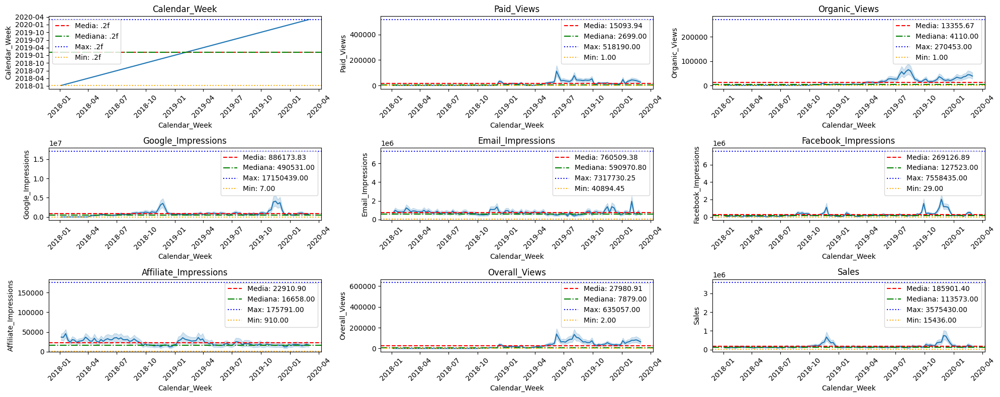

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        # Calcolare il minimo e massimo per il singolo grafico
        y_min = df[colonne[idx]].min()
        y_max = df[colonne[idx]].max()
        
        # Disegnare il grafico con la sua scala
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
        axes[row, col].set_title(f'{colonne[idx]}')
        axes[row, col].tick_params(axis='x', rotation=45)
        
        # Impostare la scala Y specifica per ciascun grafico
        #axes[row, col].set_ylim(y_min, y_max)
        
        # Aggiungere la media
        mean_value = df[colonne[idx]].mean()
        axes[row, col].axhline(mean_value, color='red', linestyle='--', label=f'Media: {mean_value:.2f}')
        
        # Aggiungere la mediana
        median_value = df[colonne[idx]].median()
        axes[row, col].axhline(median_value, color='green', linestyle='-.', label=f'Mediana: {median_value:.2f}')
        
        # Disegnare la linea del massimo picco con axhline
        axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Max: {y_max:.2f}')
        # Disegnare la linea del minimo picco con axhline
        axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Min: {y_min:.2f}')

        # Aggiungere una legenda
        axes[row, col].legend()
        
    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


In [27]:
df.columns[1:-2]
len(df)

3051

Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


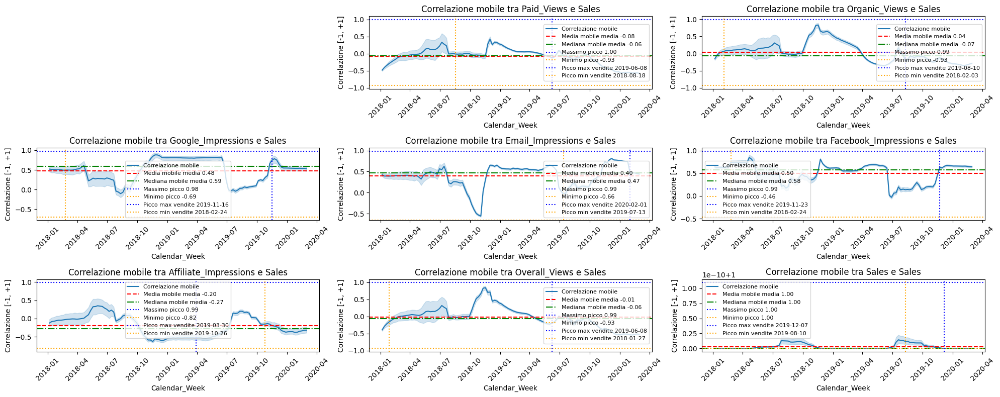

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]  # Selezione delle colonne da analizzare

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare la correlazione mobile con finestra di 30
            rolling_corr = df[colonne[idx]].rolling(window=30).corr(df['Sales'])

            # Calcolare statistiche mobili (media, mediana, massimo, minimo) su finestra rolling
            rolling_mean = rolling_corr.mean()
            rolling_median = rolling_corr.median()
            rolling_max = rolling_corr.max()
            rolling_min = rolling_corr.min()

            # Disegnare il grafico di correlazione mobile
            sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, ax=axes[row, col], label='Correlazione mobile')

            # Disegnare le medie e statistiche con axhline
            axes[row, col].axhline(y=rolling_mean, color='red', linestyle='--', label=f'Media mobile media {rolling_mean:.2f}')
            axes[row, col].axhline(y=rolling_median, color='green', linestyle='-.', label=f'Mediana mobile media {rolling_median:.2f}')
            axes[row, col].axhline(y=rolling_max, color='blue', linestyle=':', label=f'Massimo picco {rolling_max:.2f}')
            axes[row, col].axhline(y=rolling_min, color='orange', linestyle=':', label=f'Minimo picco {rolling_min:.2f}')

            p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']
                        # Aggiungere una axvline al massimo
            axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco max vendite {str(p_x_max)[:10]}')

            # Aggiungere una axvline al minimo
            axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco min vendite {str(p_x_min)[:10]}')
            
            # Impostare il titolo e le etichette degli assi
            axes[row, col].set_title(f'Correlazione mobile tra {colonne[idx]} e Sales')
            axes[row, col].set_ylabel('Correlazione [-1, +1]')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Impostare la legenda
            axes[row, col].legend(fontsize=8)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondere l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


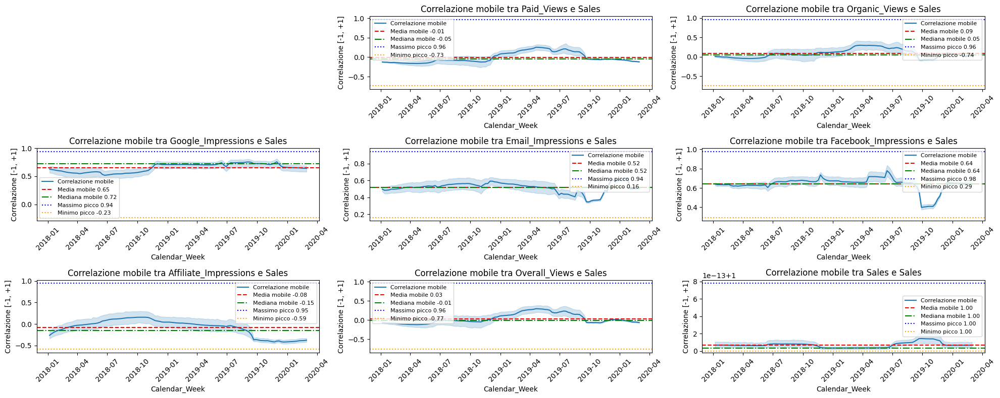

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]  # Selezione delle colonne da analizzare

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare la correlazione mobile con finestra di 30
            rolling_corr = df[colonne[idx]].rolling(window=90).corr(df['Sales'])

            # Calcolare la media mobile, la mediana mobile, massimo e minimo assoluti
            rolling_mean = rolling_corr.mean()
            rolling_median = rolling_corr.median()
            max_peak = rolling_corr.max()
            min_peak = rolling_corr.min()

            # Disegnare il grafico di correlazione mobile
            sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, ax=axes[row, col], label='Correlazione mobile')

            # Disegnare la linea della media mobile con axhline
            axes[row, col].axhline(y=rolling_mean, color='red', linestyle='--', label=f'Media mobile {rolling_mean:.2f}')
            # Disegnare la linea della mediana mobile con axhline
            axes[row, col].axhline(y=rolling_median, color='green', linestyle='-.', label=f'Mediana mobile {rolling_median:.2f}')
            # Disegnare la linea del massimo picco con axhline
            axes[row, col].axhline(y=max_peak, color='blue', linestyle=':', label=f'Massimo picco {max_peak:.2f}')
            # Disegnare la linea del minimo picco con axhline
            axes[row, col].axhline(y=min_peak, color='orange', linestyle=':', label=f'Minimo picco {min_peak:.2f}')

            # Impostare il titolo e le etichette degli assi
            axes[row, col].set_title(f'Correlazione mobile tra {colonne[idx]} e Sales')
            axes[row, col].set_ylabel('Correlazione [-1, +1]')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Impostare la legenda
            axes[row, col].legend(fontsize=8)

            # Mostrare la griglia solo per questo grafico
            #axes[row, col].grid(True)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondere l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


In [26]:
df.columns[1:9]

Index(['Calendar_Week', 'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


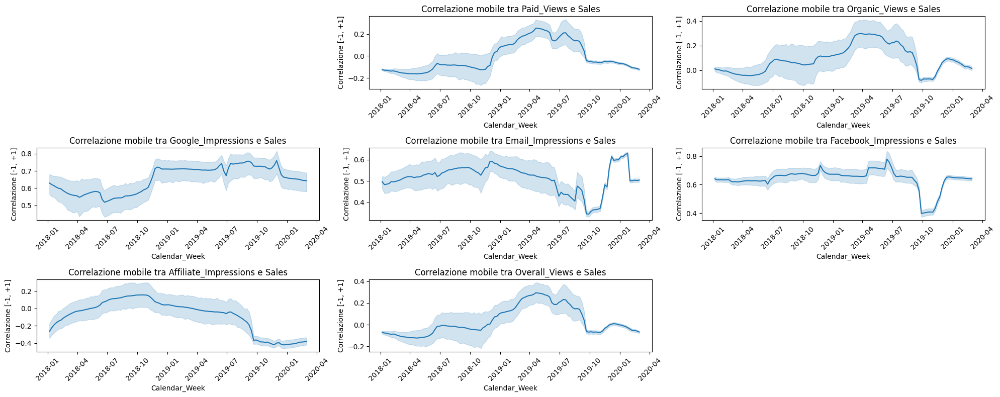

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare la correlazione mobile con finestra di 30
            rolling_corr = df[colonne[idx]].rolling(window=90).corr(df['Sales'])
            
            # Disegnare il grafico di correlazione mobile
            sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, ax=axes[row, col])
            #sns.lineplot(x=df['Calendar_Week'].iloc[29:len(rolling_corr) + 29], y=rolling_corr, ax=axes[row, col])
            axes[row, col].set_title(f'Correlazione mobile tra {colonne[idx]} e Sales')
            axes[row, col].set_ylabel('Correlazione [-1, +1]')
            axes[row, col].tick_params(axis='x', rotation=45)
        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondere l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


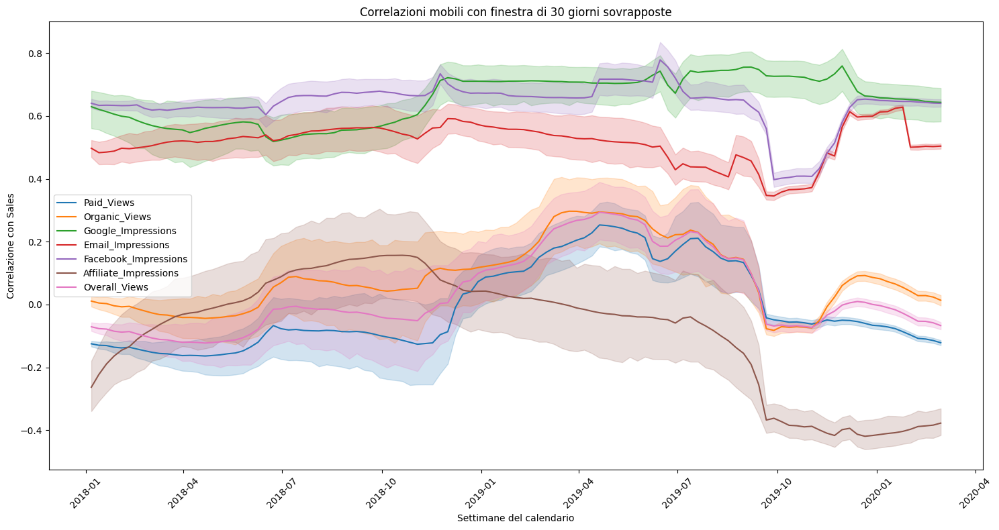

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione del grafico unico
plt.figure(figsize=(15, 8))

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per disegnare ciascun lineplot in un unico grafico
for col in colonne:
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Disegnare la correlazione mobile per ciascuna metrica
        sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, label=col)
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Ottimizzare il grafico
plt.xlabel('Settimane del calendario')
plt.ylabel('Correlazione con Sales')
plt.title('Correlazioni mobili con finestra di 90 giorni sovrapposte')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


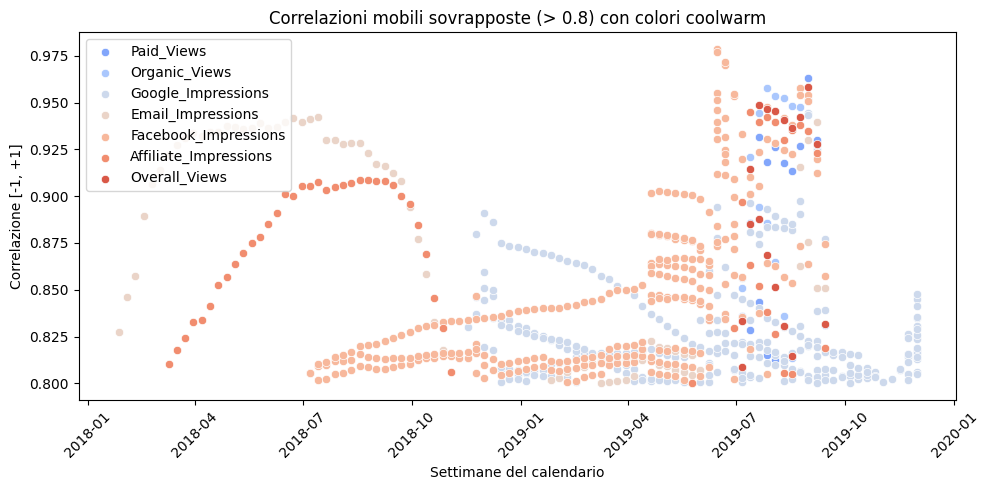

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica del grafico unico
fig, ax = plt.subplots(figsize=(10, 5))  # Un'unica finestra

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Creazione di una scala di colori con "coolwarm"
colors = sns.color_palette("coolwarm", len(colonne))

# Ciclo per sovrapporre ciascun grafico con la sua correlazione mobile
for idx, col in enumerate(colonne):
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Applicare la maschera per considerare solo valori > 0.8
        mask = rolling_corr > 0.8
        
        # Disegnare il grafico sovrapposto solo con la porzione > 0.8
        sns.scatterplot(x=df['Calendar_Week'][mask], y=rolling_corr[mask], ax=ax, label=col, color=colors[idx])
    except Exception as e:
        # Stampare l'errore se qualcosa va storto
        print(f"Errore con la metrica '{col}': {e}")

# Impostazioni titoli e leggibilità
ax.set_title('Correlazioni mobili sovrapposte (> 0.8) con colori coolwarm')
ax.set_xlabel('Settimane del calendario')
ax.set_ylabel('Correlazione [-1, +1]')
ax.tick_params(axis='x', rotation=45)  # Rotazione degli assi x per miglior leggibilità

# Leggibilità migliorata con la leggenda
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


In [15]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []

window_size = 90  # Impostiamo la finestra mobile dinamica (puoi cambiarla facilmente)

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Evitare calcoli con NaN derivanti dalla finestra mobile e mascherare solo i valori > 0.8
        corr = 0.65
        mask = (rolling_corr > corr) #& (~rolling_corr.isna())

        # Estratto solo dove la finestra è pienamente calcolata
        valid_indices = rolling_corr.index[mask]

        # Correlazioni valide e settimane corrispondenti
        valid_corr = rolling_corr.loc[valid_indices]
        valid_weeks = df.loc[valid_indices, 'Calendar_Week']

        # Solo se esistono valori validi
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

# Combina correttamente ogni serie dei dati calcolati
for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales"}, inplace=True)

# Creazione del grafico combinato
fig = go.Figure()

# Scatter plot per le correlazioni mobili
for col in filtered_df['column'].unique():
    col_df = filtered_df[filtered_df['column'] == col]
    fig.add_trace(go.Scatter(
        x=col_df['week'],
        y=col_df['rolling_corr'],
        mode='markers',
        name=col
    ))

# Linea delle vendite settimanali su scala separata con colore nero
fig.add_trace(go.Scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    yaxis="y2",
    line=dict(color="grey")  # Impostato il colore a nero
))

# Aggiornamento layout con una seconda scala Y
fig.update_layout(
    title=f"Correlazioni mobili > {corr} con finestra mobile di {window_size} giorni e vendite settimanali",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title="Correlazione con Sales",
        side="left"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [21]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Convertire la settimana in una scala mensile per aggregare
        valid_months = valid_weeks.dt.to_period('M').dt.to_timestamp()

        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "month": valid_months,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "month": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "month": data["month"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio mensile di ciascuna metrica distinta
monthly_count_corr = filtered_df.groupby(['month', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre mensili distinti per ciascun impression/colonna
for col in monthly_count_corr['column'].unique():
    col_df = monthly_count_corr[monthly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip
    fig.add_trace(go.Bar(
        x=col_df['month'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[f"Impression: {col}<br>Mese: {month}<br>Conteggio correlazioni: {count}" 
              for month, count in zip(col_df['month'], col_df['count_corr'])],
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} mensili per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Mesi",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare 


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [38]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Calcolare correlazioni settimanali
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio settimanale di ciascuna metrica distinta
weekly_count_corr = filtered_df.groupby(['week', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre settimanali distinti per ciascun impression/colonna con dettagli nel tooltip
for col in weekly_count_corr['column'].unique():
    col_df = weekly_count_corr[weekly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip con dettagli
    fig.add_trace(go.Bar(
        x=col_df['week'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[
            f"Impression: {col}<br>"
            f"Settimana: {week.strftime('%Y-%U')}<br>"
            f"Conteggio correlazioni: {count}"
            for week, count in zip(col_df['week'], col_df['count_corr'])
        ],
        textposition='auto',
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} settimanali per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [104]:
df_columns[2:]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views', 'Sales'], dtype='object')

# Analisi grafici basati sul tempo
Come si può notare dai grafici, prendendo come riferimento l'ultimo in basso a destra, ovvero quello che mostra le vendite di settimana in settimana


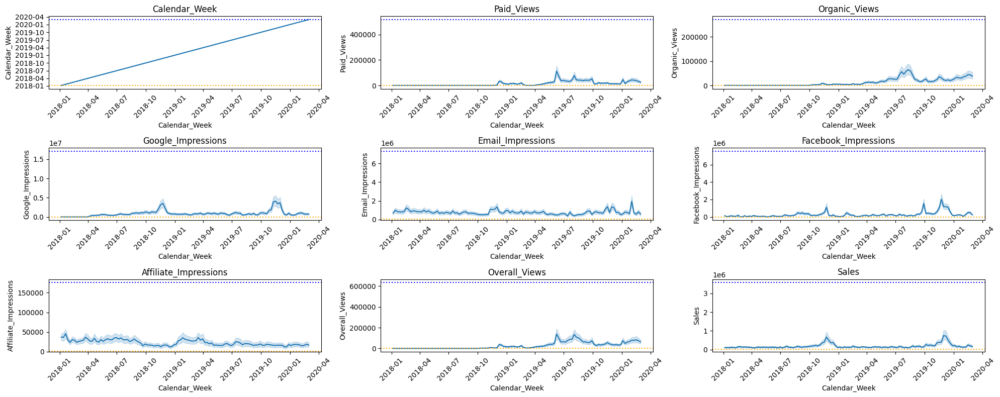

In [50]:
import numpy as np

# Creazione della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici


# Lista delle metriche da visualizzare
colonne = df.columns[1:]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
        
        y_min = df[colonne[idx]].min()
        y_max = df[colonne[idx]].max()
        # Disegnare la linea del massimo picco con axhline
        axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Massimo picco {y_max:.2f}')
        # Disegnare la linea del minimo picco con axhline
        axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Minimo picco {y_min:.2f}')
        
        axes[row, col].set_title(f'{colonne[idx]}')
        axes[row, col].tick_params(axis='x', rotation=45)
    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()



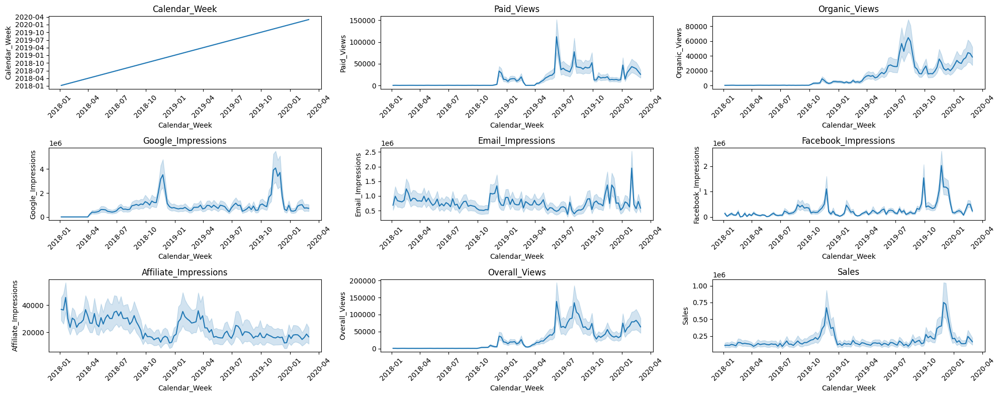

In [13]:
import numpy as np

# Creazione della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici


# Lista delle metriche da visualizzare
colonne = df.columns[1:]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
        axes[row, col].set_title(f'{colonne[idx]}')
        axes[row, col].tick_params(axis='x', rotation=45)
    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


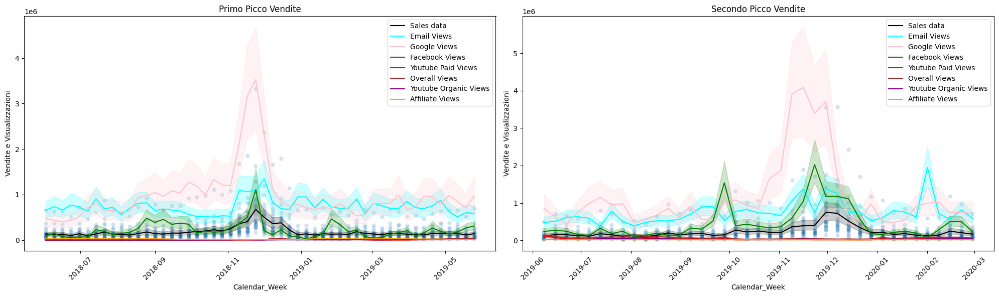

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creazione della figura con 2 sottoplot
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Creazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'black', 'Sales data'),
    ('Email_Impressions', 'cyan', 'Email Views'),
    ('Google_Impressions', 'pink', 'Google Views'),
    ('Facebook_Impressions', 'green', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'brown', 'Overall Views'),
    ('Organic_Views', 'purple', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'orange', 'Affiliate Views')
]

# Grafico sul primo sottoplot
sns.scatterplot(data=df_primo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[0], alpha=0.2)
for y_col, color, label in plot_info:
    sns.lineplot(data=df_primo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[0], color=color, label=label)

axes[0].tick_params(axis='x', rotation=45)
axes[0].set_title('Primo Picco Vendite')
axes[0].set_ylabel('Vendite e Visualizzazioni')
axes[0].legend()

# Grafico sul secondo sottoplot
sns.scatterplot(data=df_secondo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[1], alpha=0.2)
for y_col, color, label in plot_info:
    sns.lineplot(data=df_secondo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[1], color=color, label=label)

axes[1].tick_params(axis='x', rotation=45)
axes[1].set_title('Secondo Picco Vendite')
axes[1].set_ylabel('Vendite e Visualizzazioni')
axes[1].legend()

# Mostrare il layout combinato
plt.tight_layout()
plt.show()


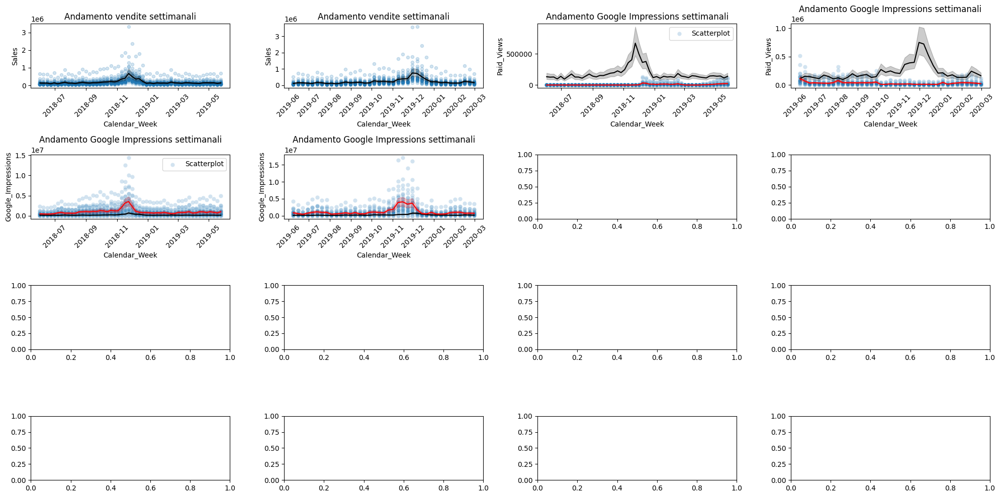

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(20, 10))
#print(df['Calendar_Week'].head())
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'blue', 'Sales data'),
    ('Email_Impressions', 'cyan', 'Email Views'),
    ('Google_Impressions', 'pink', 'Google Views'),
    ('Facebook_Impressions', 'green', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'brown', 'Overall Views'),
    ('Organic_Views', 'purple', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'orange', 'Affiliate Views')
]

### Inizio prima coppia grafici
df_primo_picco_vendite.plot(kind='scatter', x='Calendar_Week', y='Sales',ax=axes[0,0], alpha=0.2)
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[0,0], color = 'black')
#sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[0,0], color = 'red')
axes[0,0].tick_params(axis='x', rotation=45)
axes[0,0].set_title('Andamento vendite settimanali')

df_secondo_picco_vendite.plot(kind='scatter', x='Calendar_Week', y='Sales',ax=axes[0,1], alpha=0.2)
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[0,1], color = 'black')
#sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[0,1], color = 'red')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].set_title('Andamento vendite settimanali')
### Fine prima coppia grafici

### Inizio seconda coppia grafici
sns.scatterplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Paid_Views',ax=axes[0,2], alpha=0.2, label='Scatterplot')#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[0,2])
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[0,2], color = 'black')
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Paid_Views',ax=axes[0,2], color = 'red')
axes[0,2].tick_params(axis='x', rotation=45)
axes[0,2].set_title('Andamento Google Impressions settimanali')

sns.scatterplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Paid_Views',ax=axes[0,3], alpha=0.2)#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[1,0])
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[0,3], color = 'black')
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Paid_Views',ax=axes[0,3], color = 'red')
axes[0,3].tick_params(axis='x', rotation=45)
axes[0,3].set_title('Andamento Google Impressions settimanali')
### Fine seconda coppia grafici


### Inizio terza coppia grafici
sns.scatterplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,0], alpha=0.2)#, label='Scatterplot')#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[1,0])
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[1,0], color = 'black')
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,0], color = 'red')
axes[1,0].tick_params(axis='x', rotation=45)
axes[1,0].set_title('Andamento Google Impressions settimanali')

sns.scatterplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,1], alpha=0.2)#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[1,0])
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[1,1], color = 'black')
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,1], color = 'red')
axes[1,1].tick_params(axis='x', rotation=45)
axes[1,1].set_title('Andamento Google Impressions settimanali')
### Fine terza coppia grafici

plt.tight_layout()
#print(df3.describe())
plt.show()
#df3.describe().round(2)

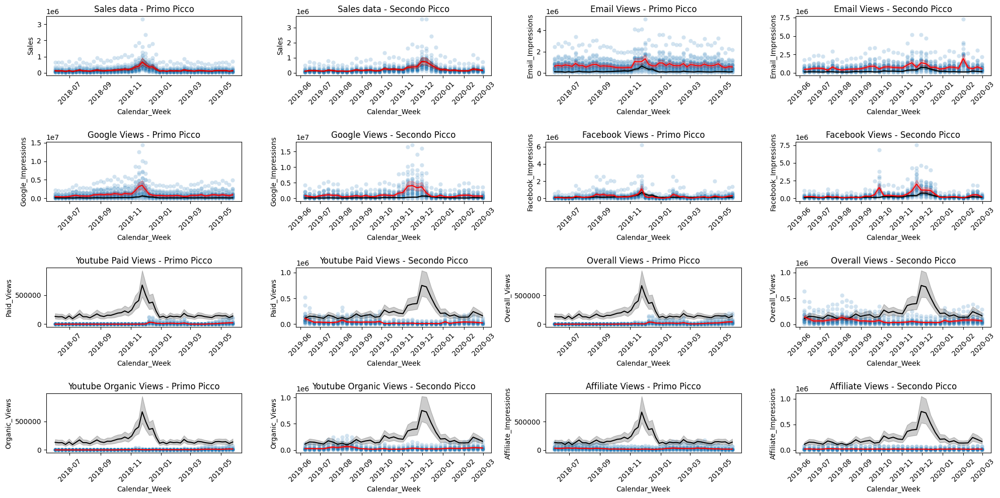

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Separazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'red', 'Sales data'),
    ('Email_Impressions', 'red', 'Email Views'),
    ('Google_Impressions', 'red', 'Google Views'),
    ('Facebook_Impressions', 'red', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'red', 'Overall Views'),
    ('Organic_Views', 'red', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'red', 'Affiliate Views')
]

# Creazione della griglia 4x4
fig, axes = plt.subplots(4, 4, figsize=(20, 10))

# Ciclo per assegnare ciascun elemento della lista plot_info a una coppia di grafici nella rispettiva riga
for idx, (y_col, color, title) in enumerate(plot_info):
    # Determinare la posizione sulla griglia 4x4
    row = idx // 2  # Calcola la riga
    col_left = idx * 2 % 4  # Colonna sinistra
    col_right = col_left + 1  # Colonna destra

    # Scatter e lineplot per il primo sottoinsieme di dati
    sns.scatterplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        alpha=0.2
    )
    sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_left], color = 'black')
    sns.lineplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        color=color
    )
    axes[row, col_left].tick_params(axis='x', rotation=45)
    axes[row, col_left].set_title(f'{title} - Primo Picco')

    # Scatter e lineplot per il secondo sottoinsieme di dati
    sns.scatterplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        alpha=0.2
    )
    sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_right], color = 'black')
    sns.lineplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        color=color
    )
    axes[row, col_right].tick_params(axis='x', rotation=45)
    axes[row, col_right].set_title(f'{title} - Secondo Picco')

# Ottimizzazione della visualizzazione
plt.tight_layout()
plt.show()


In [28]:
#df['Month'] = df['Calendar_Week'].dt.month_name()
df.columns[2:9]


Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

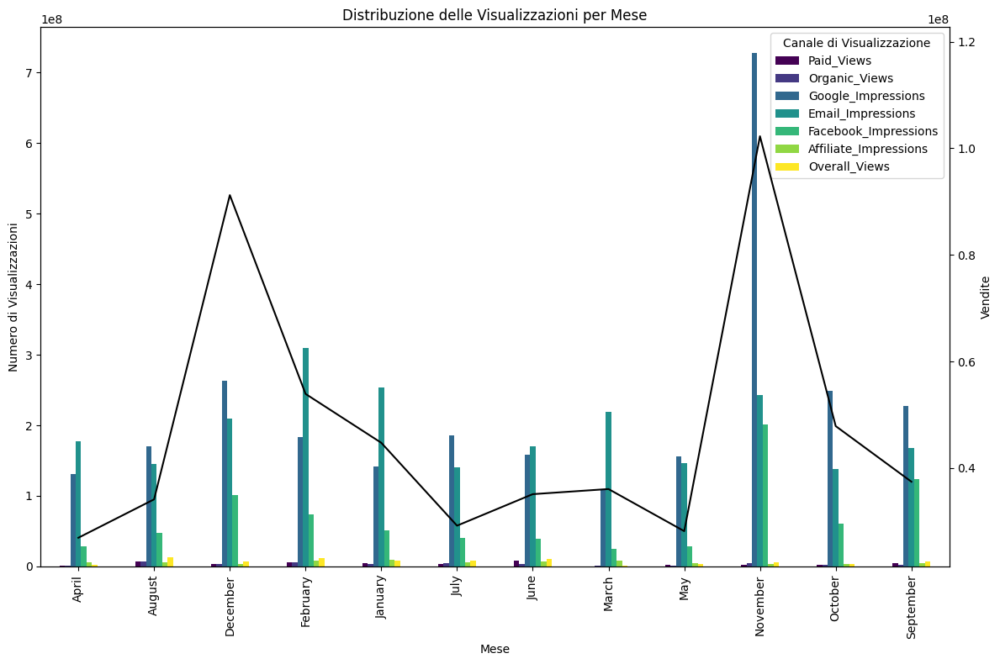

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Calcolare il pivot per il grafico a barre
pivot_data = df.groupby('Month')[df.columns[2:9]].sum()

# Creare la figura e l'asse principale
fig, ax1 = plt.subplots(figsize=(12, 8))

# Grafico a barre stacked
pivot_data.plot(kind='bar', stacked=False, colormap='viridis', ax=ax1)
ax1.set_ylabel('Numero di Visualizzazioni')
ax1.set_xlabel('Mese')
ax1.set_title('Distribuzione delle Visualizzazioni per Mese')
ax1.legend(title='Canale di Visualizzazione')

# Creare l'asse secondario per il grafico a linee
ax2 = ax1.twinx()

# Preparare i dati di Sales aggregati per ciascun mese
sales_per_month = df.groupby('Month')['Sales'].sum()

# Tracciare la linea delle vendite (con x = indici dei mesi)
sns.lineplot(x=sales_per_month.index, y=sales_per_month.values, color='black', ax=ax2)
ax2.set_ylabel('Vendite')

# Impostare la scala Y corretta per il grafico a linee
ax2.set_ylim(sales_per_month.min() * 0.8, sales_per_month.max() * 1.2)  # Aggiustamento dinamico della scala

# Ottimizzare il layout
plt.tight_layout()
plt.show()

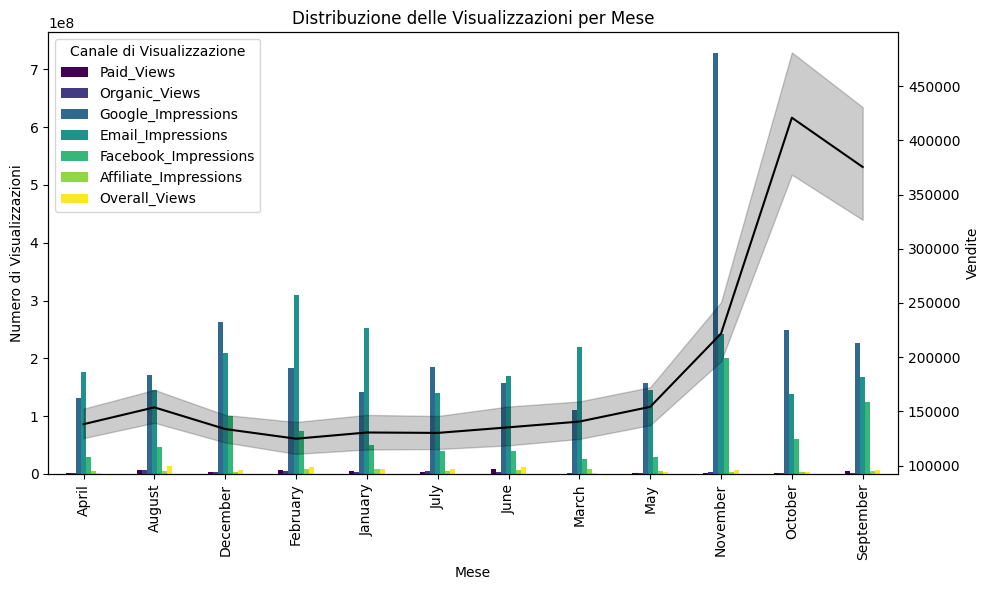

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
#df['Month'] = df['Calendar_Week'].dt.month_name()

# Calcolare il pivot per il grafico a barre
pivot_data = df.groupby('Month')[df.columns[2:9]].sum()

# Creare la figura e gli assi
fig, ax1 = plt.subplots(figsize=(10, 6))

# Grafico a barre stacked
pivot_data.plot(kind='bar', colormap='viridis', ax=ax1)
ax1.set_ylabel('Numero di Visualizzazioni')
ax1.set_xlabel('Mese')
ax1.set_title('Distribuzione delle Visualizzazioni per Mese')
ax1.legend(title='Canale di Visualizzazione')

# Creare l'asse secondario per il grafico a linee
ax2 = ax1.twinx()

# Grafico a linee sovrapposto
sns.lineplot(data=df, x='Month', y='Sales', color='black', ax=ax2)
ax2.set_ylabel('Vendite')

# Mostrare il layout combinato
plt.tight_layout()
plt.show()


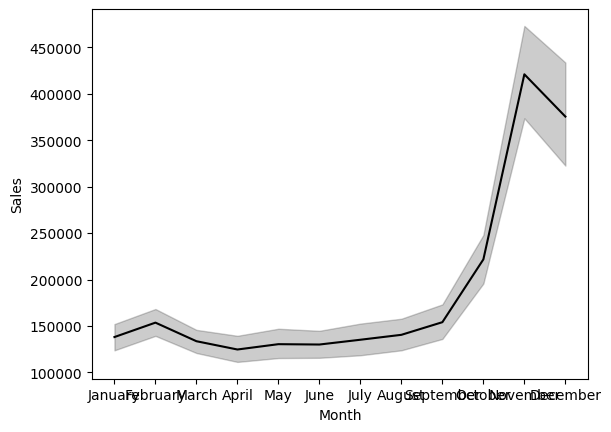

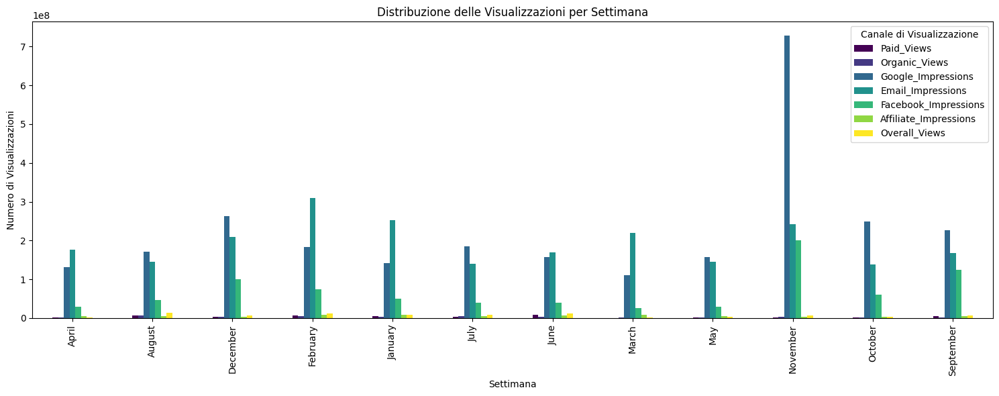

In [ ]:
df['Month'] = df['Calendar_Week'].dt.month_name()#.dt.to_timestamp()
# Raggruppare i dati per settimana
#da = df.drop('Calendar_Week').groupby('Division').sum()
#pivot_data = df.groupby('Calendar_Week')[df.columns[2:-3]].sum()
pivot_data = df.groupby('Month')[df.columns[2:8]].sum()
#sns.lineplot(data = df, x='Month', y='Sales', color = 'black')
# Creare il grafico a barre stacked
pivot_data.plot(kind='bar', figsize=(15, 6), colormap='viridis')
plt.title('Distribuzione delle Visualizzazioni per Settimana')
plt.ylabel('Numero di Visualizzazioni')
plt.xlabel('Settimana')
plt.legend(title='Canale di Visualizzazione')
plt.tight_layout()
plt.show()

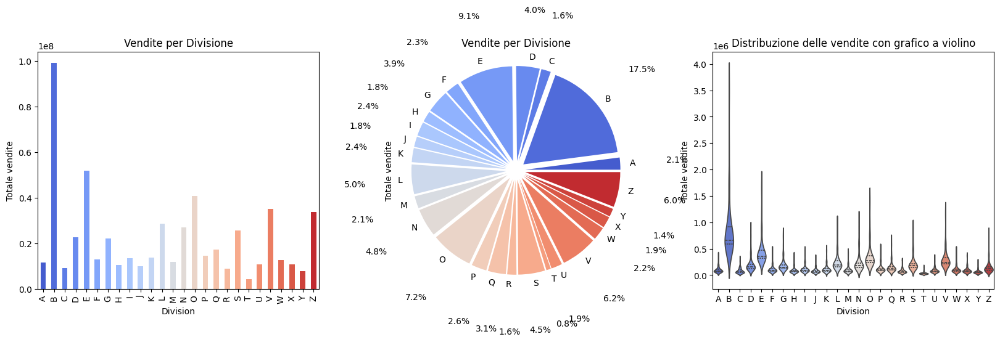

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns


# Definizione di una palette comune
palette = sns.color_palette("coolwarm", len(df['Division'].unique()))

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Grafico a barre
df.groupby('Division')['Sales'].sum().plot(kind='bar', ax=axes[0], color=palette)
axes[0].set_title('Vendite per Divisione')
axes[0].set_ylabel("Totale vendite")

# Grafico a torta
df_grouped = df.groupby('Division')['Sales'].sum()
axes[1].pie(df_grouped, labels=df_grouped.index, autopct='%1.1f%%', pctdistance=1.6, colors=palette, explode= [0.1] * len(df_grouped))
axes[1].set_title("Vendite per Divisione")
axes[1].set_ylabel("Totale vendite")

# Grafico a violino
sns.violinplot(x='Division', y='Sales', data=df, inner='quartile', palette=palette, ax=axes[2])
axes[2].set_title('Distribuzione delle vendite con grafico a violino')
axes[2].set_ylabel("Totale vendite")

plt.show()


In [49]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]

        # Se ci sono valori validi, aggiungere al conteggio
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "count": len(valid_corr)  # Conteggio degli eventi validi
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
df_counts = pd.DataFrame(rolling_data)

# Calcolare la percentuale complessiva di ciascun gruppo
df_counts['percent'] = (df_counts['count'] / df_counts['count'].sum()) * 100  # Calcolo della distribuzione in percentuale

# Creazione grafico con Plotly - Bubble Chart
fig = go.Figure()

# Grafico a bolle con la grandezza delle bolle basata sulla percentuale complessiva
fig.add_trace(go.Scatter(
    x=df_counts['column'],  # Variabile x: il nome della metrica (gruppo)
    y=df_counts['count'],  # Variabile y: conteggio effettivo
    mode='markers',
    marker=dict(
        size=df_counts['percent'],  # La grandezza delle bolle è proporzionale alla percentuale
        color=df_counts['percent'],  # Opzionalmente, possiamo anche colorare in base alla percentuale
        showscale=True
    ),
    text=[
        f"Colonna: {col}<br>"
        f"Conteggio: {count}<br>"
        f"Percentuale: {percent:.2f}%"
        for col, count, percent in zip(
            df_counts['column'],
            df_counts['count'],
            df_counts['percent']
        )
    ],
    hoverinfo="text"
))

# Aggiornamento layout
fig.update_layout(
    title="Bubble Chart basato sulla percentuale complessiva dei gruppi",
    xaxis_title="Impression",
    yaxis_title="Conteggio",
    showlegend=False
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


ValueError: could not convert string to float: 'January'

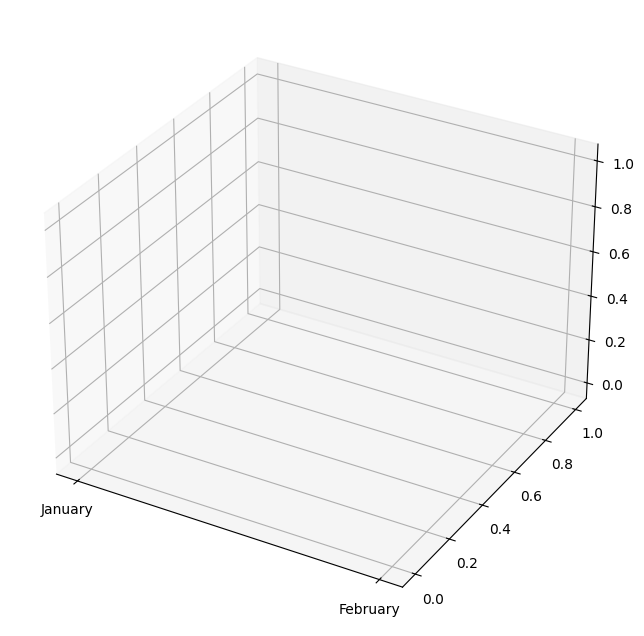

In [ ]:
#from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['Month'], df['Google_Impressions'], df['Sales'], c='b', marker='o')

ax.set_xlabel('Paid Views')
ax.set_ylabel('Organic Views')
ax.set_zlabel('Sales')
plt.title('Scatter 3D: Paid vs Organic vs Sales')
plt.show()


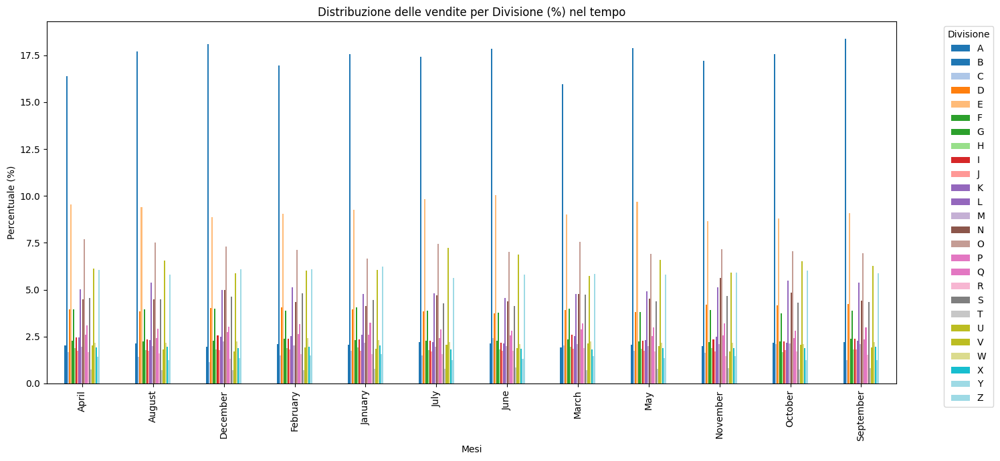

In [33]:
import matplotlib.pyplot as plt

# Creazione della tabella pivot per calcolare le percentuali
pivot_percentage = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')
pivot_percentage = pivot_percentage.div(pivot_percentage.sum(axis=1), axis=0) * 100

# Impostare una figura più chiara e con legenda ben posizionata
fig, ax = plt.subplots(figsize=(15, 7))

# Creare il grafico a barre con le percentuali
pivot_percentage.plot(kind='bar', stacked=False, ax=ax, colormap='tab20')

# Migliorare la leggibilità
ax.set_title('Distribuzione delle vendite per Divisione (%) nel tempo')
ax.set_ylabel('Percentuale (%)')
ax.set_xlabel('Mesi')
ax.legend(title='Divisione', bbox_to_anchor=(1.05, 1), loc='upper left')  # Posizionare la legenda fuori dal grafico

plt.tight_layout()  # Ottimizzare lo spazio tra elementi
plt.show()


  Division Calendar_Week  Paid_Views  Organic_Views  Google_Impressions  Email_Impressions  Facebook_Impressions  Affiliate_Impressions  Overall_Views  Sales     Month
0        A    2018-01-06         392            422                 408        349895.0107                 73580                  12072            682  59417   January
1        A    2018-01-13         787            904                 110        506270.2176                 11804                   9499            853  56806   January
2        A    2018-01-20          81            970                 742        430042.1538                 52232                  17048            759  48715   January
3        A    2018-01-27          25            575                  65        417745.6658                 78640                  10207            942  72047   January
4        A    2018-02-03         565            284                 295        408505.8012                 40561                   5834            658  56235  F

<Axes: xlabel='Month'>

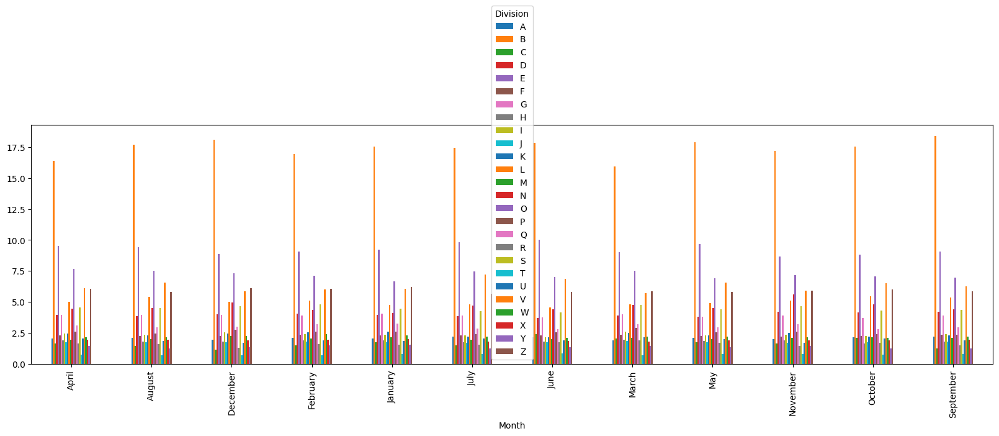

In [71]:
#fig, axes = plt.subplots(1, 2, figsize=(15, 5))
print(df.head())
#df['Month'] = df['Calendar_Week'].dt.month_name()
#df3 = df.groupby('Division', 'Calendar_Week')['Sales'].sum().unstuck()#.plot(kind='bar', ax=axes[0])
#df3.head()
#df.groupby('Division')['Sales'].sum().plot(kind='pie', ax=axes[1])
#pivot_table = df.pivot_table(values='Sales', index='Calendar_Week', columns='Division', aggfunc='sum')
#print(pivot_table)
pivot_table = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')

# Calcolare le percentuali
pivot_percentage = pivot_table.div(pivot_table.sum(axis=1), axis=0) * 100

print(pivot_percentage)

pivot_percentage.plot(kind='bar', figsize=(20,5))


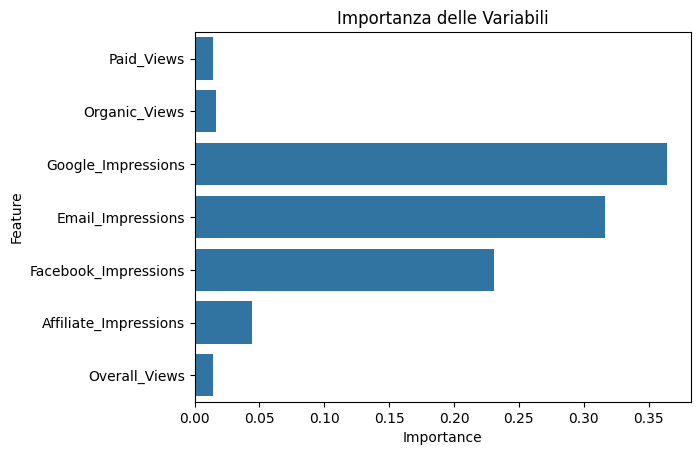

In [37]:
from sklearn.ensemble import RandomForestRegressor
#'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'
X = df[df.columns[2:9]].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()


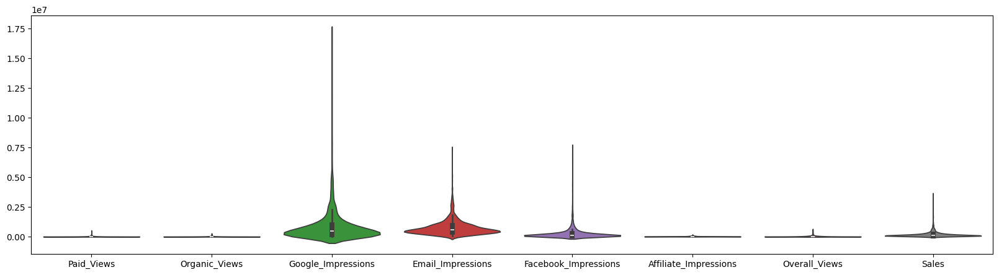

In [38]:
#df1.plot(kind='box', figsize=(20,5))#, y=df.columns[1])#, figsize=(20,10))
plt.figure(figsize=(20,5))
sns.violinplot(df1)
plt.show()


<Axes: >

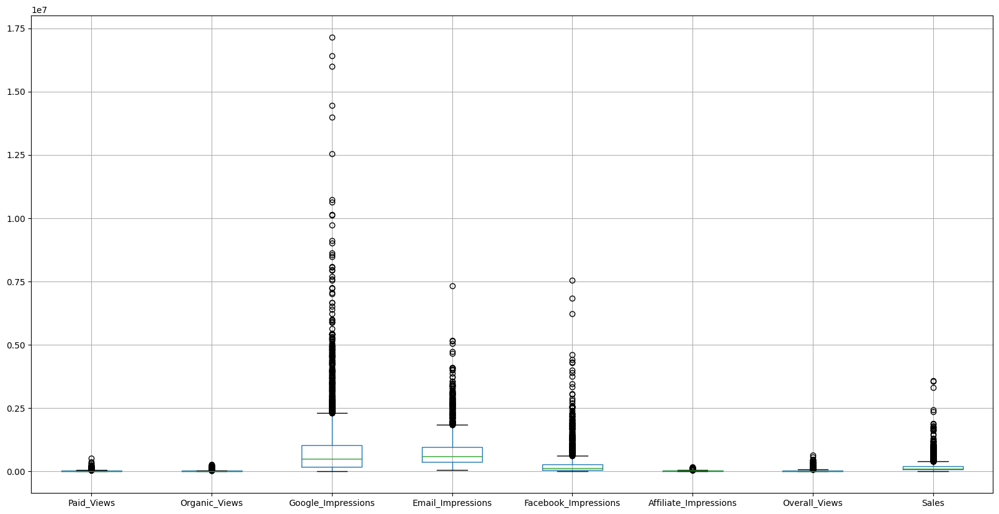

In [39]:
pd.plotting.boxplot(df1, figsize=(20,10))

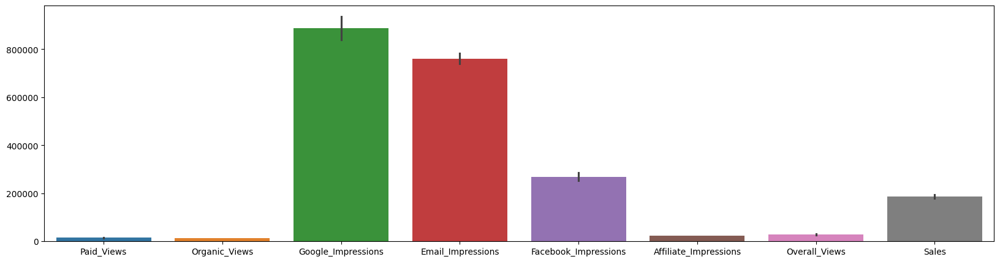

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20,5))
sns.barplot(data=df1)#, x='categoria', y='valore')
plt.show()


In [55]:
df.groupby('Calendar_Week')[df1.columns[2:8]].sum().reset_index().round(2).head()

,Calendar_Week,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
0,2018-01-06,16934,18463630.22,3694309,995533,16447,2961900
1,2018-01-13,12548,26708959.97,626000,983495,17111,3043768
2,2018-01-20,14895,22657725.11,2304353,1234005,11919,2967530
3,2018-01-27,13324,22043459.89,3575722,814181,13857,3359958
4,2018-02-03,12932,21541137.98,2008599,636301,16783,3156423


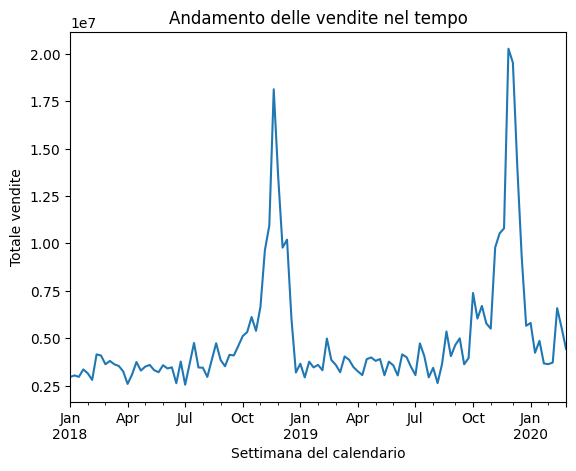

In [59]:
#import matplotlib.pyplot as plt

df.groupby('Calendar_Week')['Sales'].sum().plot()
plt.title("Andamento delle vendite nel tempo")
plt.xlabel("Settimana del calendario")
plt.ylabel("Totale vendite")
plt.show()


In [44]:
df.groupby('Division').agg({
    'Paid_Views': ['sum', 'mean'],
    'Organic_Views': ['sum', 'mean'],
    'Sales': ['sum', 'mean'],
})#.reset_index()


Paid_Views               Organic_Views                   Sales  \
                sum          mean           sum          mean       sum   
Division                                                                  
A           1061783   9396.309735        909863   8051.884956  11683210   
B           7527708  66616.884956       6519191  57691.955752  99002756   
C            108427    959.530973        135895   1202.610619   9225321   
D           2238510  19809.823009       2028824  17954.194690  22785935   
E           3441144  30452.601770       2992901  26485.849558  51751484   
F           1914599  16943.353982       1544318  13666.530973  12935321   
G           2169649  19200.433628       1770566  15668.725664  22167862   
H            684837   6060.504425        659244   5834.017699  10429504   
I            831597   7359.265487        817686   7236.159292  13504117   
J            679025   6009.070796        684900   6061.061947   9994114   
K           1149462  10172.230088       1008983   8929.053097  13671170   
L           1920057  16991.654867       1920360  16994.336283  28635392   
M           1566413  13862.061947       1239961  10973.106195  11859481   
N           1299940  11503.893805       1202831  10644.522124  27090216   
O           3074747  27210.150442       2429347  21498.646018  40695480   
P            573628   5076.353982        731108   6469.982301  14662927   
Q           1247619  11040.876106       1174651  10395.141593  17333122   
R            412241   3648.150442        435318   3852.371681   8861836   
S           1439409  12738.132743       1365242  12081.787611  25708360   
T            271545   2403.053097        356134   3151.628319   4331495   
U            945847   8370.327434        878835   7777.300885  10670449   
V           6055275  53586.504425       4487830  39715.309735  35148066   
W            897823   7945.336283        913089   8080.433628  12567313   
X            907171   8028.061947        846100   7487.610619  10829554   
Y            525436   4649.876106        537520   4756.814159   7823559   
Z           3107724  13750.991150       3157462  13971.070796  33817117   

                         
                   mean  
Division                 
A         103391.238938  
B         876130.584071  
C          81640.008850  
D         201645.442478  
E         457977.734513  
F         114471.867257  
G         196175.769912  
H          92296.495575  
I         119505.460177  
J          88443.486726  
K         120983.805310  
L         253410.548673  
M         104951.159292  
N         239736.424779  
O         360136.991150  
P         129760.415929  
Q         153390.460177  
R          78423.327434  
S         227507.610619  
T          38331.814159  
U          94428.752212  
V         311044.831858  
W         111215.159292  
X          95836.761062  
Y          69235.035398  
Z         149633.261062

In [41]:
df[['Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions']].sum().round(2)


Google_Impressions       2.703716e+09
Email_Impressions        2.320314e+09
Facebook_Impressions     8.211061e+08
Affiliate_Impressions    6.990116e+07
dtype: float64

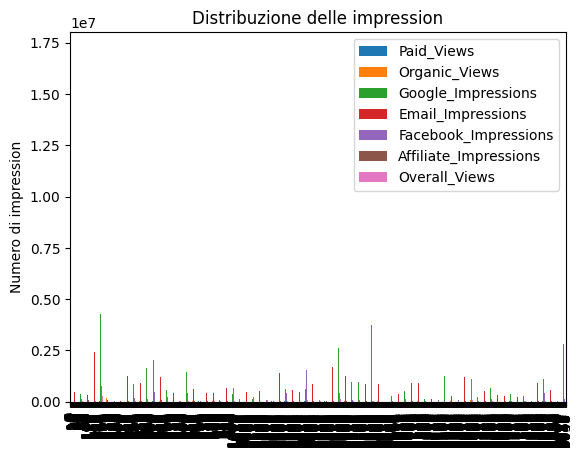

In [60]:
df[df_columns[2:9]].plot(kind='bar')
plt.title("Distribuzione delle impression")
plt.ylabel("Numero di impression")
plt.show()


In [27]:
df['Paid_vs_Organic_Percentage'] = df['Paid_Views'] / df['Overall_Views'] * 100
df['Paid_vs_Organic_Percentage']

0       57.478006
1       92.262603
2       10.671937
3        2.653928
4       85.866261
          ...    
3046    54.482270
3047    48.877294
3048    44.543835
3049    42.081632
3050    37.191236
Name: Paid_vs_Organic_Percentage, Length: 3051, dtype: float64

In [28]:
df['Conversion_Rate'] = df['Sales'] / df['Overall_Views']
df['Conversion_Rate']

0       87.121701
1       66.595545
2       64.183136
3       76.483015
4       85.463526
          ...    
3046     1.541115
3047     1.574639
3048     2.651590
3049     2.265801
3050     2.283737
Name: Conversion_Rate, Length: 3051, dtype: float64

In [29]:
df['Impression_to_Sales_Ratio'] = df['Sales'] / (df['Google_Impressions'] + df['Email_Impressions'] +
                                                  df['Facebook_Impressions'] + df['Affiliate_Impressions'])
df['Impression_to_Sales_Ratio']

0       0.136292
1       0.107652
2       0.097418
3       0.142201
4       0.123540
          ...   
3046    0.038673
3047    0.060564
3048    0.116405
3049    0.073972
3050    0.092648
Name: Impression_to_Sales_Ratio, Length: 3051, dtype: float64

<Axes: >

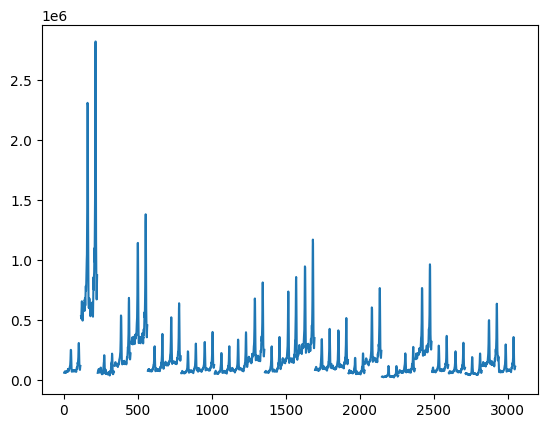

In [65]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(4).mean())
df['Rolling_Sales'].plot()

In [33]:
df[df['Paid_Views'] > df['Paid_Views'].median()]#.plot(kind='bar')


,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Paid_vs_Organic_Percentage,Conversion_Rate,Impression_to_Sales_Ratio
48,A,2018-12-08,24788,1632,558879,4.258051e+05,68776,5247,26253,187382,94.419685,7.137546,0.176991
49,A,2018-12-15,20699,2982,462233,3.540469e+05,146088,4837,23170,190487,89.335347,8.221278,0.196946
50,A,2018-12-22,9967,3548,405196,3.452593e+05,60643,5060,12683,109947,78.585508,8.668848,0.134713
51,A,2018-12-29,7077,3641,428545,4.862113e+05,46804,5208,10368,66448,68.258102,6.408951,0.068732
52,A,2019-01-05,6132,3471,391548,4.853858e+05,19462,6301,7952,69510,77.112676,8.741197,0.077003
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,Z,2020-02-01,29239,25311,622406,1.459071e+06,45026,12098,53667,82707,54.482270,1.541115,0.038673
3047,Z,2020-02-08,26230,28031,624409,5.342505e+05,227070,9548,53665,84503,48.877294,1.574639,0.060564
3048,Z,2020-02-15,24749,31281,439362,4.227182e+05,393685,9861,55561,147325,44.543835,2.651590,0.116405
3049,Z,2020-02-22,20713,30356,464178,6.085799e+05,424676,10221,49221,111525,42.081632,2.265801,0.073972


In [71]:
from ydata_profiling import ProfileReport

# Crea il report con YData Profiling
profile = ProfileReport(df, title="Profilo dei Dati", explorative=True)
profile.to_notebook_iframe()

# Salva il report come HTML
#profile.to_file("ydata_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

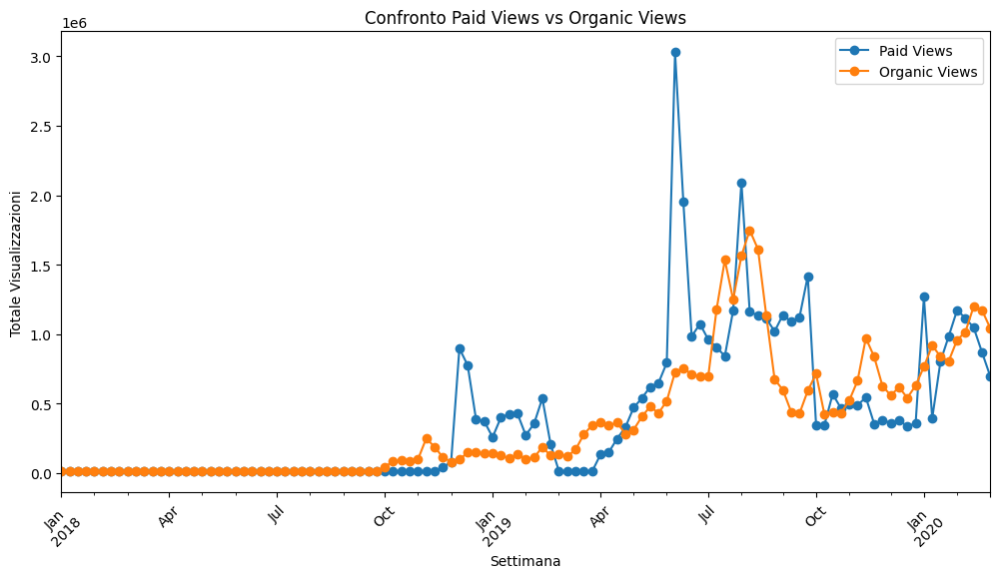

In [110]:
df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views']].sum().plot(marker='o', linestyle='-', figsize=(12, 6))
plt.title('Confronto Paid Views vs Organic Views')
plt.xlabel('Settimana')
plt.ylabel('Totale Visualizzazioni')
plt.legend(['Paid Views', 'Organic Views'])
plt.xticks(rotation=45)
plt.show()


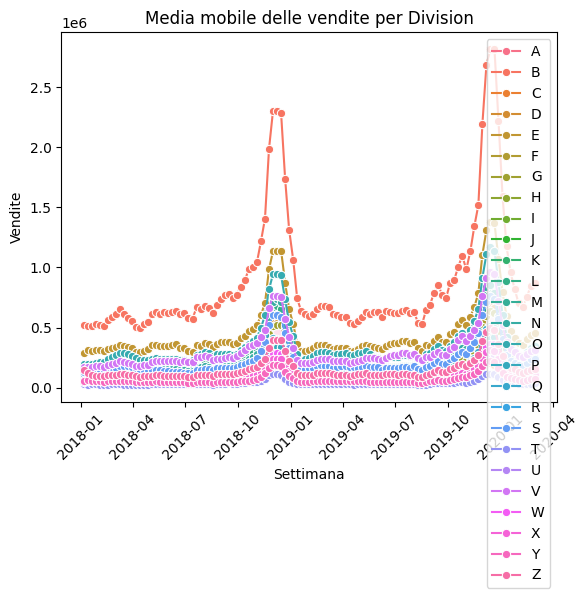

In [26]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(window=4, min_periods=1).mean())

sns.lineplot(x='Calendar_Week', y='Rolling_Sales', hue='Division', data=df, marker='o')
plt.title('Media mobile delle vendite per Division')
plt.xlabel('Settimana')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.legend()
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\886627153.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Sales', data=df, palette="muted")


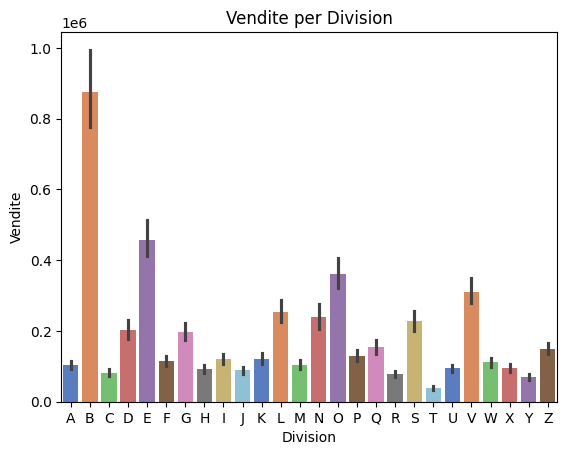

In [115]:
sns.barplot(x='Division', y='Sales', data=df, palette="muted")
plt.title('Vendite per Division')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3820791365.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Paid_Views', data=df, palette="coolwarm")


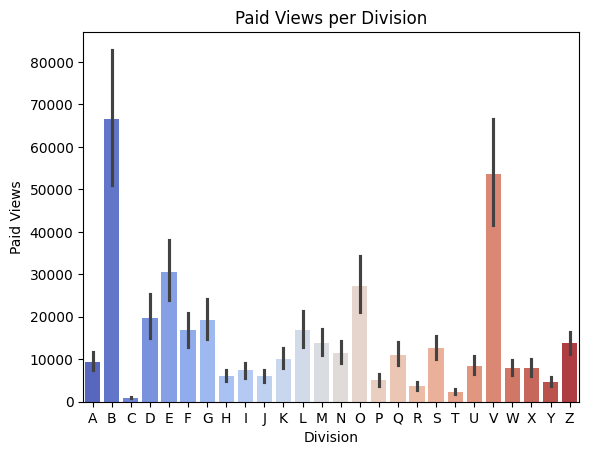

In [116]:
sns.barplot(x='Division', y='Paid_Views', data=df, palette="coolwarm")
plt.title('Paid Views per Division')
plt.xlabel('Division')
plt.ylabel('Paid Views')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3820044304.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Division', y='Sales', data=df, palette="coolwarm")


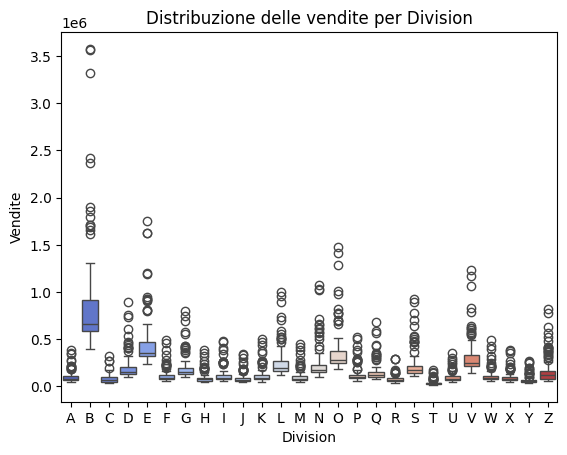

In [119]:
sns.boxplot(x='Division', y='Sales', data=df, palette="coolwarm")
plt.title('Distribuzione delle vendite per Division')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


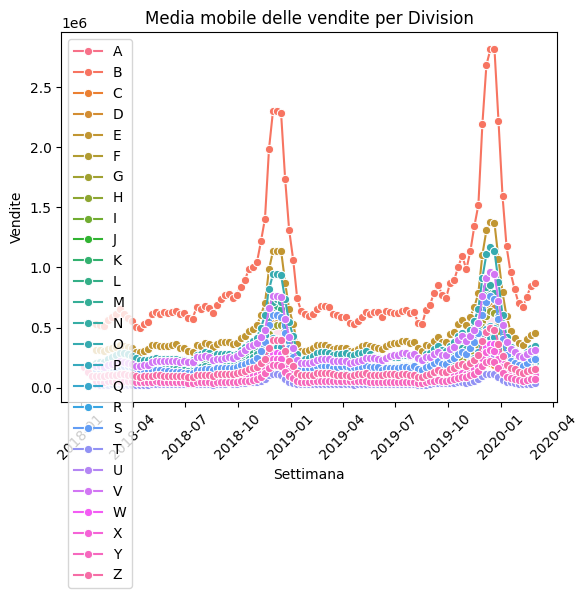

In [121]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(4).mean())

sns.lineplot(x='Calendar_Week', y='Rolling_Sales', hue='Division', data=df, marker='o')
plt.title('Media mobile delle vendite per Division')
plt.xlabel('Settimana')
plt.ylabel('Vendite')
plt.legend()
plt.xticks(rotation=45)
plt.show()


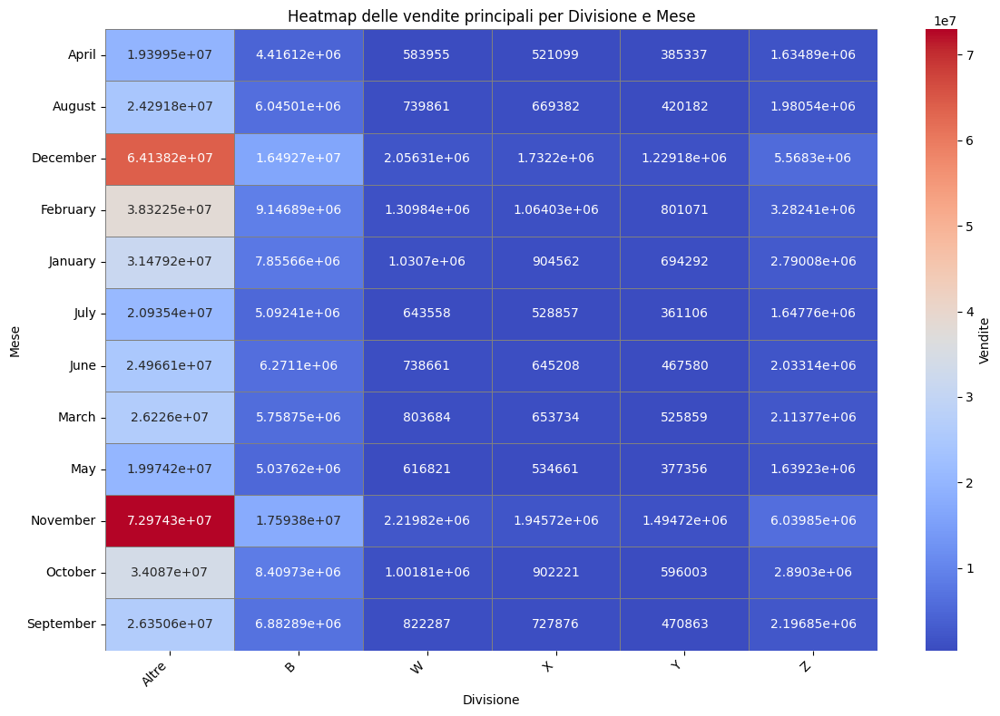

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt



# Creazione della matrice pivot con raggruppamento mensile
pivot_table = df.pivot_table(values='Sales', index='Month', columns='Grouped_Division', aggfunc='sum')

# Impostare la figura per la heatmap con dimensioni appropriate
plt.figure(figsize=(12, 8))

sns.heatmap(
    pivot_table,
    annot=True,
    fmt='g',
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Vendite'},
    vmin=pivot_table.min().min(),
    vmax=pivot_table.max().max()
)

plt.title('Heatmap delle vendite principali per Divisione e Mese')
plt.xlabel('Divisione')
plt.ylabel('Mese')

# Ruotare le etichette per leggibilità
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Ottimizzare il layout per una visualizzazione chiara
plt.tight_layout()
plt.show()


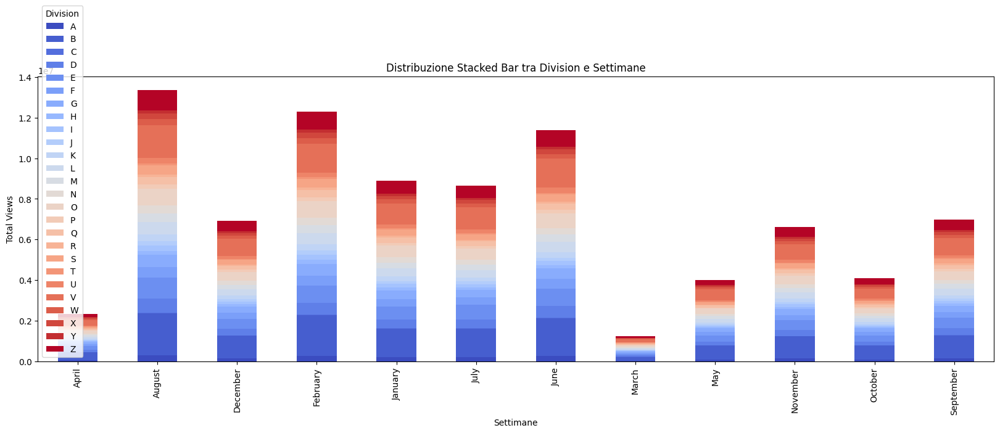

In [84]:
df['Total_Views'] = df['Paid_Views'] + df['Organic_Views']

pivot_stacked = df.pivot_table(values='Total_Views', index='Month', columns='Division', aggfunc='sum')

pivot_stacked.plot(kind='bar', stacked=True, figsize=(20, 6), cmap='coolwarm')
plt.title('Distribuzione Stacked Bar tra Division e Settimane')
plt.xlabel('Settimane')
plt.ylabel('Total Views')
plt.xticks(rotation=90)
plt.legend(title="Division")
plt.show()


In [85]:
df1['Rolling_Paid_Views'] = df1['Paid_Views'].rolling(4).mean()
df1['Rolling_Organic_Views'] = df1['Organic_Views'].rolling(4).mean()

sns.lineplot(x='Calendar_Week', y='Rolling_Paid_Views', label='Rolling Paid Views', marker='o')
sns.lineplot(x='Calendar_Week', y='Rolling_Organic_Views', label='Rolling Organic Views', marker='o')
plt.title('Confronto tra Paid Views e Organic Views con Rolling Average')
plt.xlabel('Settimane')
plt.ylabel('Numero di Visualizzazioni')
plt.xticks(rotation=45)
plt.legend()
plt.show()


ValueError: Could not interpret value `Calendar_Week` for `x`. Value is a string, but `data` was not passed.

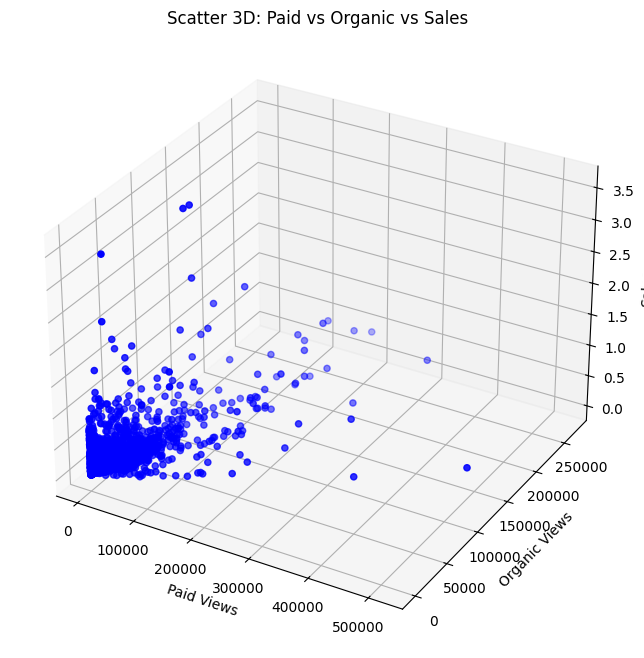

In [ ]:
#from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['Paid_Views'], df['Organic_Views'], df['Sales'], c='b', marker='o')

ax.set_xlabel('Paid Views')
ax.set_ylabel('Organic Views')
ax.set_zlabel('Sales')
plt.title('Scatter 3D: Paid vs Organic vs Sales')
plt.show()


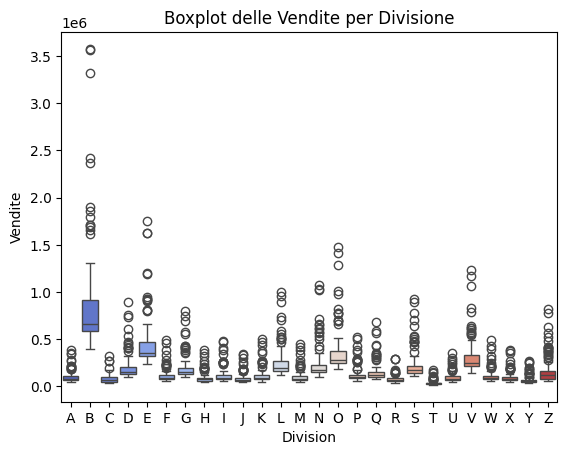

In [129]:
sns.boxplot(x='Division', y='Sales', hue='Division', data=df, palette="coolwarm")
plt.title('Boxplot delle Vendite per Divisione')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


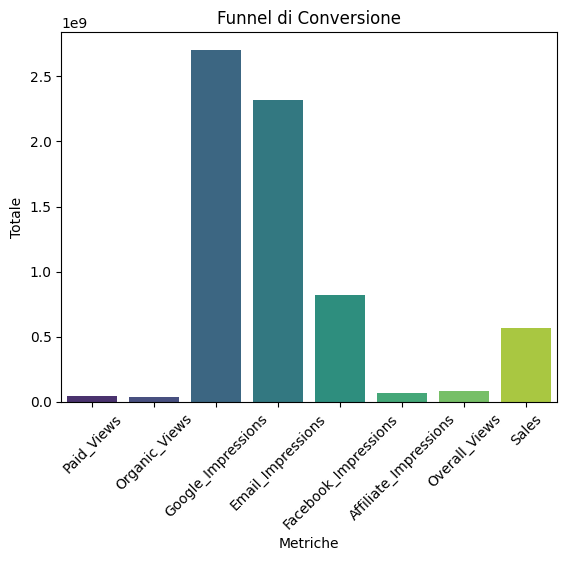

In [78]:
funnel_data = df[df_columns[2:]].sum()

sns.barplot(x=funnel_data.index, y=funnel_data.values, palette="viridis")
plt.title('Funnel di Conversione')
plt.xlabel('Metriche')
plt.ylabel('Totale')
plt.xticks(rotation=45)
plt.show()


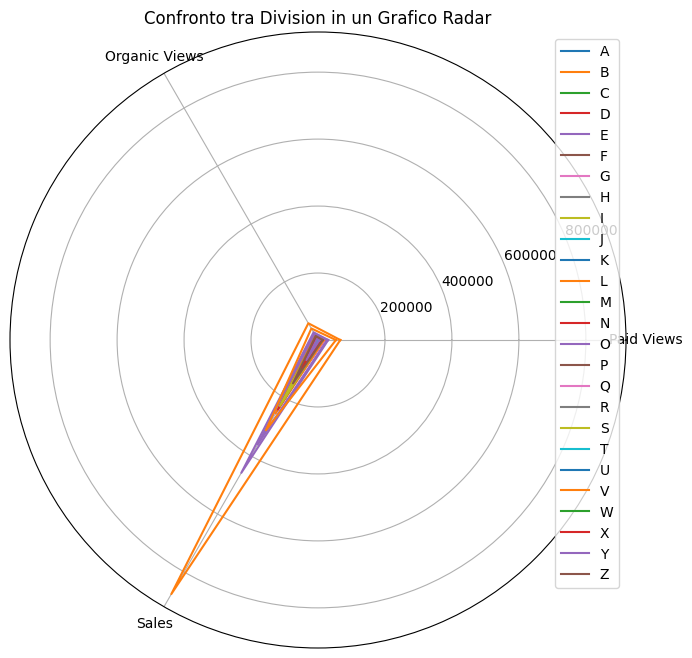

In [137]:
from math import pi

# Calcolo dei valori medi per ogni divisione
division_means = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].mean().reset_index()
num_vars = len(division_means.columns) - 1

# Impostazione degli angoli per il grafico radar
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Chiudere il ciclo del radar

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

for i in range(len(division_means)):
    values = division_means.iloc[i].drop('Division').values.tolist()
    values += values[:1]  # Chiudere il ciclo
    ax.plot(angles, values, label=division_means['Division'].iloc[i])

ax.set_xticks(angles[:-1])
ax.set_xticklabels(['Paid Views', 'Organic Views', 'Sales'])

plt.legend()
plt.title("Confronto tra Division in un Grafico Radar")
plt.show()


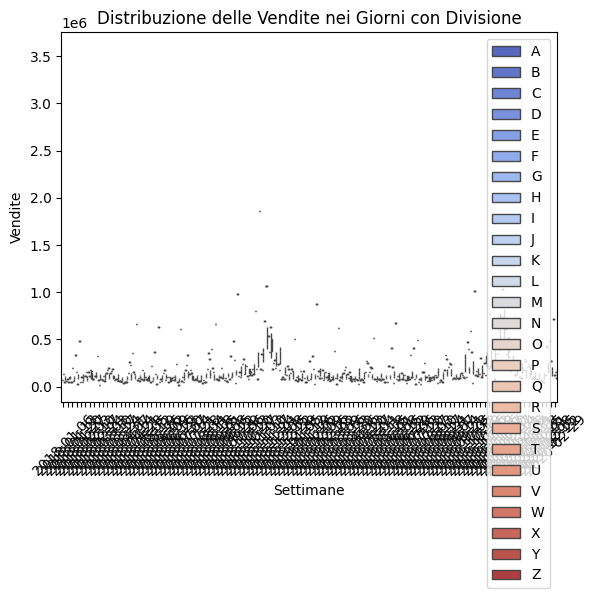

In [45]:
sns.boxplot(x='Calendar_Week', y='Sales', hue='Division', data=df, palette="coolwarm")
plt.xticks(rotation=45)
plt.title('Distribuzione delle Vendite nei Giorni con Divisione')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.legend()
plt.show()


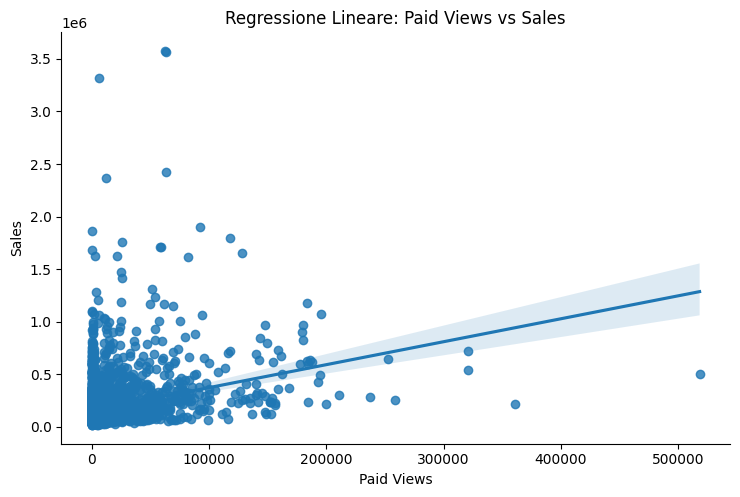

In [141]:
sns.lmplot(x='Paid_Views', y='Sales', data=df, aspect=1.5)
plt.title('Regressione Lineare: Paid Views vs Sales')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\1617746123.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Percentage', data=df_grouped, palette="coolwarm")


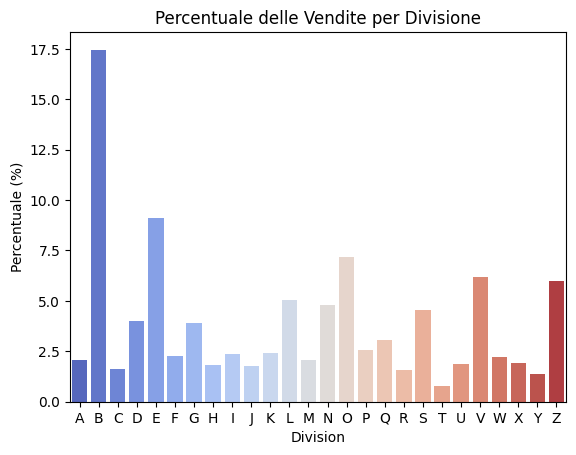

In [142]:
df_grouped = df.groupby('Division')['Sales'].sum().reset_index()
df_grouped['Percentage'] = (df_grouped['Sales'] / df_grouped['Sales'].sum()) * 100

sns.barplot(x='Division', y='Percentage', data=df_grouped, palette="coolwarm")
plt.title('Percentuale delle Vendite per Divisione')
plt.xlabel('Division')
plt.ylabel('Percentuale (%)')
plt.show()


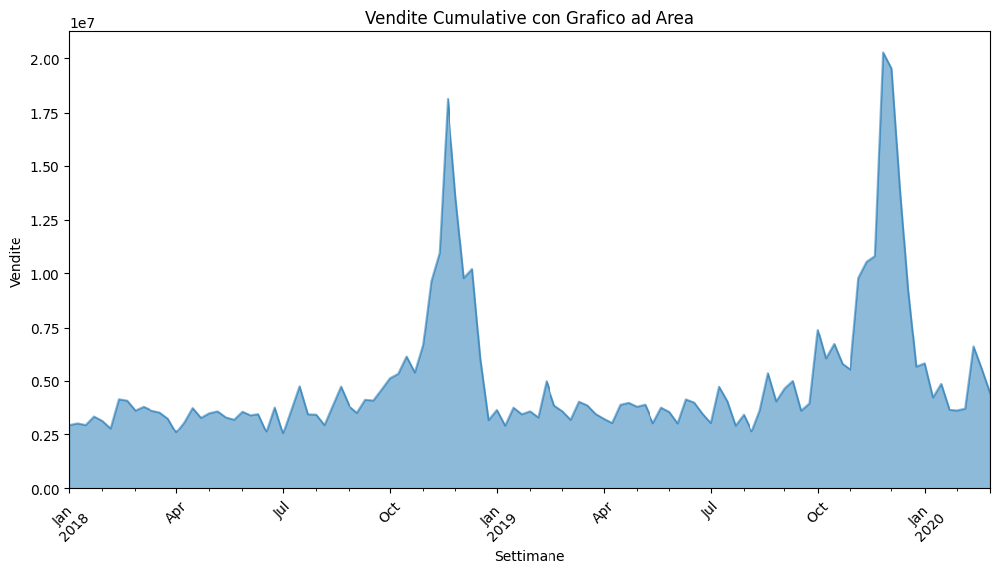

In [79]:
df_grouped_time = df.groupby('Calendar_Week')['Sales'].sum()#.cumsum()

df_grouped_time.plot(kind='area', figsize=(12, 6), alpha=0.5)
plt.title('Vendite Cumulative con Grafico ad Area')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


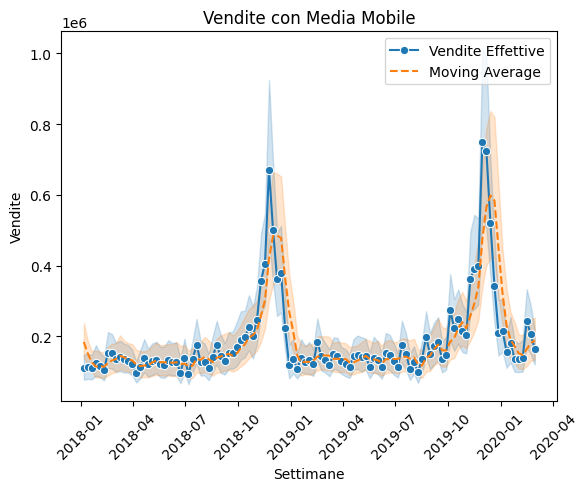

In [144]:
df['Moving_Avg_Sales'] = df['Sales'].rolling(window=4).mean()

sns.lineplot(x='Calendar_Week', y='Sales', label='Vendite Effettive', marker='o', data=df)
sns.lineplot(x='Calendar_Week', y='Moving_Avg_Sales', label='Moving Average', linestyle='--', data=df)
plt.title('Vendite con Media Mobile')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.legend()
plt.show()


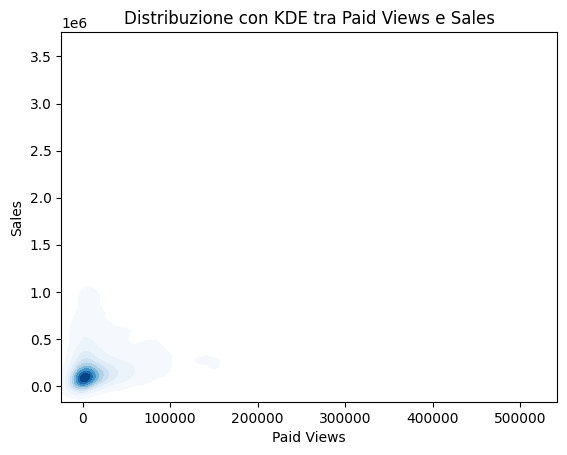

In [145]:
sns.kdeplot(x='Paid_Views', y='Sales', fill=True, cmap="Blues", data=df)
plt.title('Distribuzione con KDE tra Paid Views e Sales')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.show()


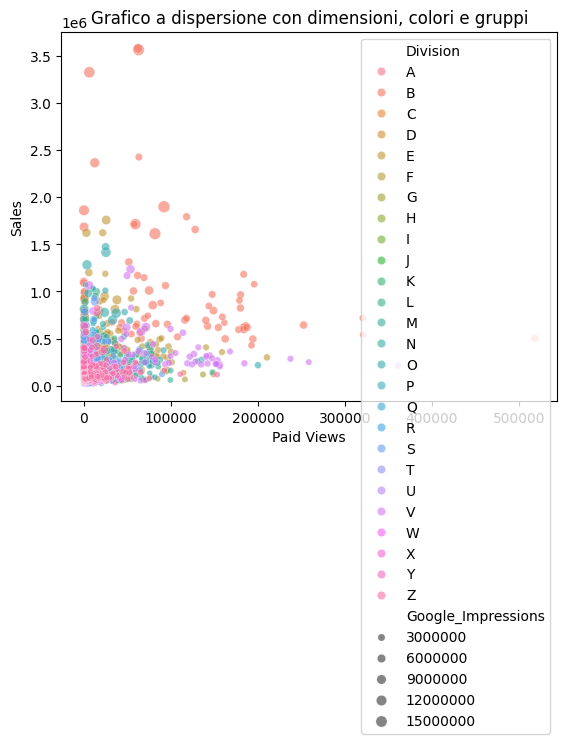

In [146]:
sns.scatterplot(x='Paid_Views', y='Sales', hue='Division', size='Google_Impressions', alpha=0.6, data=df)
plt.title('Grafico a dispersione con dimensioni, colori e gruppi')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.legend()
plt.show()


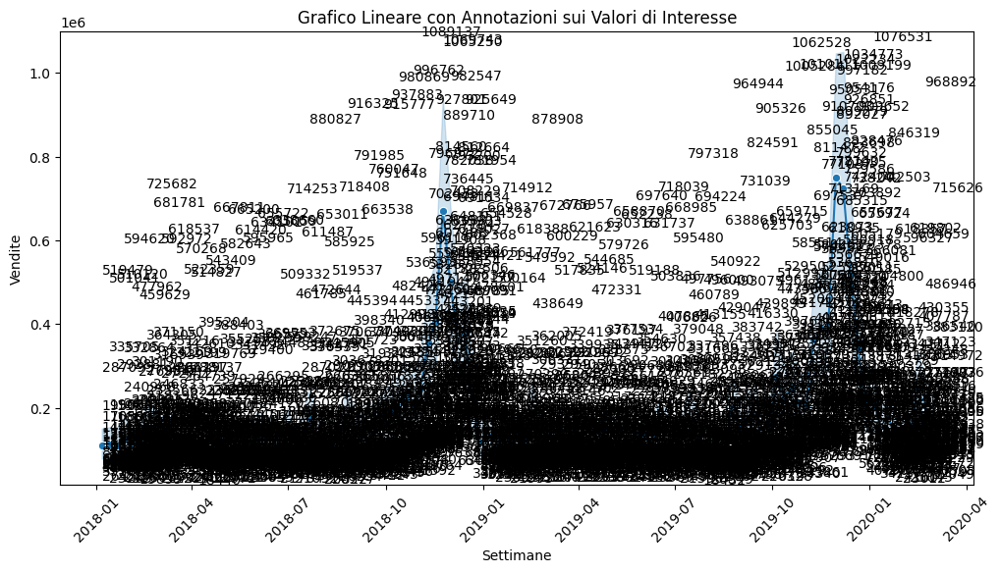

In [80]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Calendar_Week', y='Sales', data=df, marker='o')
for idx, row in df.iterrows():
    if row['Sales'] > 12:  # Evidenziare valori significativi
        plt.annotate(
            f'{row["Sales"]}', 
            (row['Calendar_Week'], row['Sales']), 
            # textcoords="offset points", 
            # xytext=(0, 5), 
            # ha='center',
            # fontsize=10,
            # color='red'
        )
plt.title('Grafico Lineare con Annotazioni sui Valori di Interesse')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


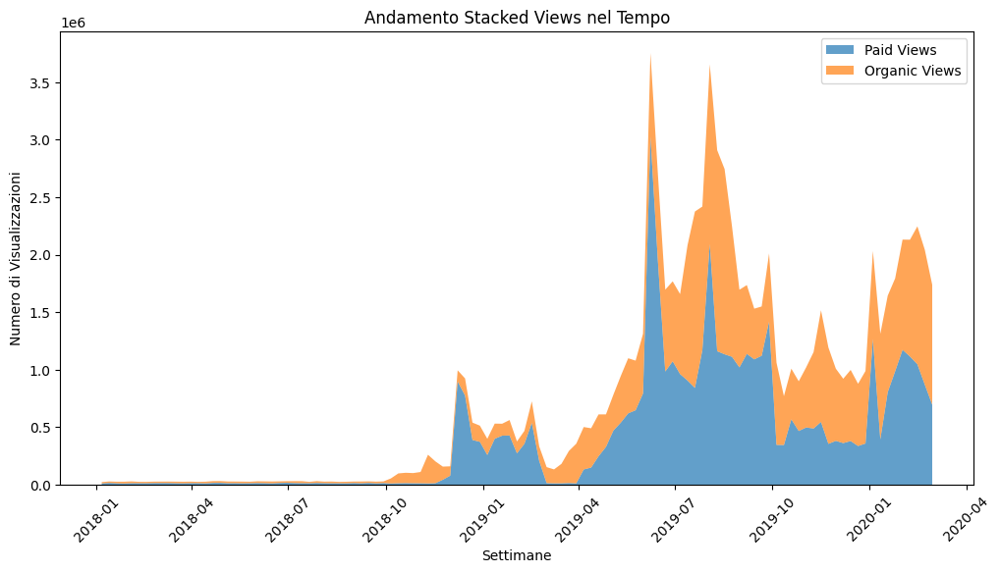

In [148]:
df_group = df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views']].sum()

plt.figure(figsize=(12, 6))
plt.stackplot(df_group.index, df_group['Paid_Views'], df_group['Organic_Views'], labels=['Paid Views', 'Organic Views'], alpha=0.7)
plt.title('Andamento Stacked Views nel Tempo')
plt.xlabel('Settimane')
plt.ylabel('Numero di Visualizzazioni')
plt.legend()
plt.xticks(rotation=45)
plt.show()


C:\Users\Utente\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


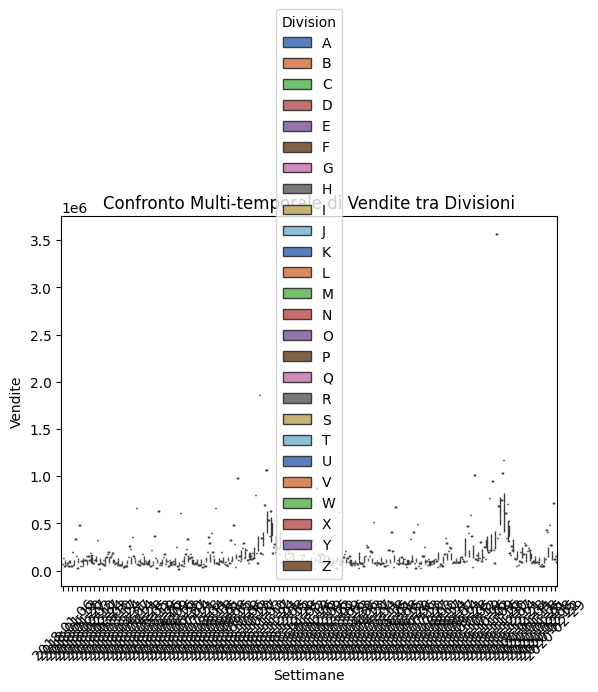

In [149]:
sns.boxplot(x='Calendar_Week', y='Sales', hue='Division', data=df, palette="muted")
plt.title('Confronto Multi-temporale di Vendite tra Divisioni')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


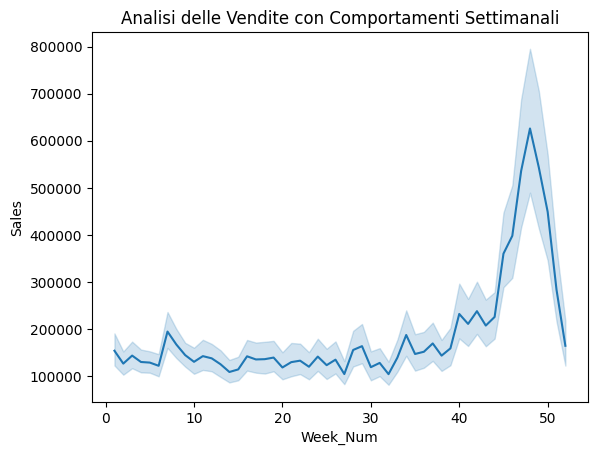

In [150]:
df['Week_Num'] = df['Calendar_Week'].dt.isocalendar().week
sns.lineplot(x='Week_Num', y='Sales', data=df)
plt.title("Analisi delle Vendite con Comportamenti Settimanali")
plt.show()


In [ ]:
from sklearn.cluster import KMeans

features = df[['Paid_Views', 'Organic_Views', 'Sales']].dropna()
kmeans = KMeans(n_clusters=4)
df['Cluster'] = kmeans.fit_predict(features)

sns.scatterplot(x='Paid_Views', y='Sales', hue='Cluster', data=df)
plt.title("Cluster Analysis con KMeans")
plt.show()


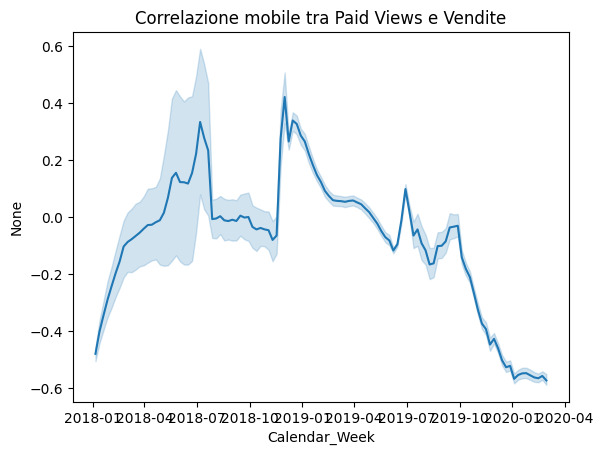

In [81]:
rolling_corr = df['Paid_Views'].rolling(30).corr(df['Sales'])
sns.lineplot(x=df['Calendar_Week'], y=rolling_corr)
plt.title('Correlazione mobile tra Paid Views e Vendite')
plt.show()


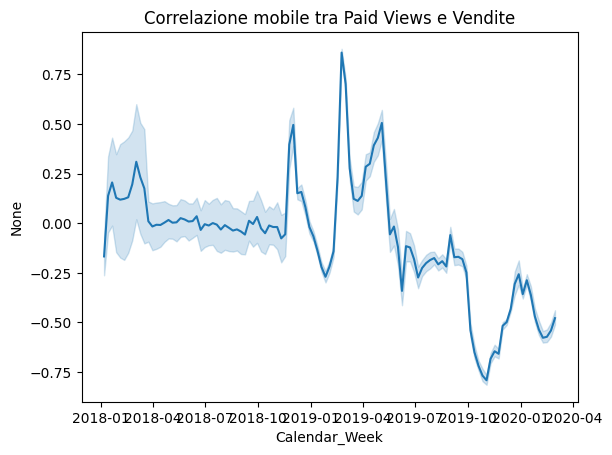

In [151]:
rolling_corr = df['Paid_Views'].rolling(12).corr(df['Sales'])
sns.lineplot(x=df['Calendar_Week'], y=rolling_corr)
plt.title('Correlazione mobile tra Paid Views e Vendite')
plt.show()


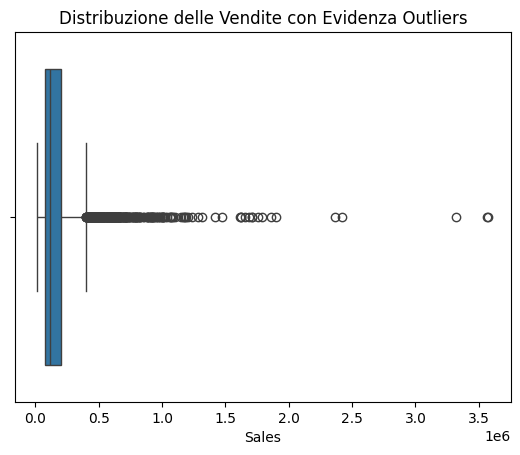

In [152]:
sns.boxplot(x=df['Sales'])
plt.title('Distribuzione delle Vendite con Evidenza Outliers')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\2873712132.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Sales', data=df_grouped_division, palette="viridis")


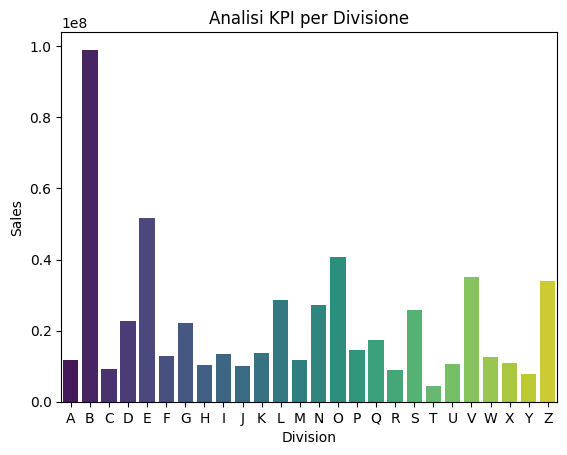

In [153]:
df_grouped_division = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].sum().reset_index()
sns.barplot(x='Division', y='Sales', data=df_grouped_division, palette="viridis")
plt.title("Analisi KPI per Divisione")
plt.show()


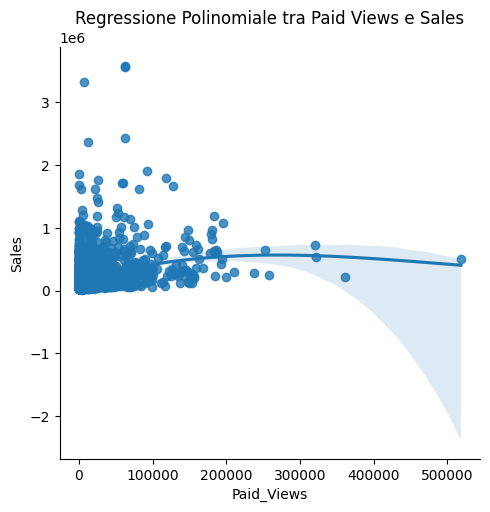

In [154]:
sns.lmplot(x='Paid_Views', y='Sales', data=df, order=3)  # Regressione non lineare
plt.title('Regressione Polinomiale tra Paid Views e Sales')
plt.show()


In [155]:
df_corr_time = df.groupby('Calendar_Week')[['Paid_Views', 'Sales']].corr().unstack().reset_index()
sns.heatmap(df_corr_time.pivot_table(index=0, columns=1), cmap='coolwarm')
plt.title('Correlazioni variabili su scala temporale')
plt.show()


KeyError: 0

C:\Users\Utente\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


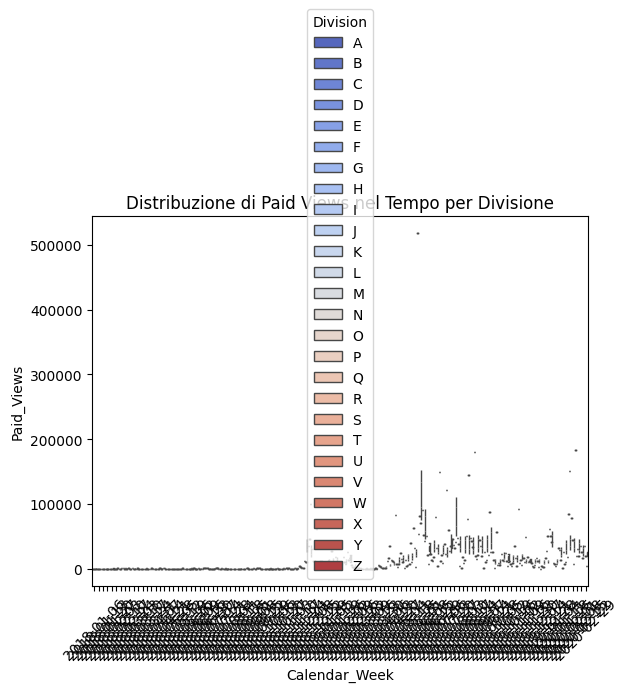

In [156]:
sns.boxplot(x='Calendar_Week', y='Paid_Views', hue='Division', data=df, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('Distribuzione di Paid Views nel Tempo per Divisione')
plt.show()


In [157]:
sns.histplot(df['Sales'], kde=True, hue=df['Division'], multiple="stack")
plt.title('Distribuzione delle Vendite con Sovrapposizione per Divisione')
plt.show()


ValueError: The following variable cannot be assigned with wide-form data: `hue`

In [ ]:
df_grouped_cascade = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].sum().reset_index()
fig, ax = plt.subplots(figsize=(10, 6))

# Grafico a cascata con calcoli progressivi
ax.bar(df_grouped_cascade['Division'], df_grouped_cascade['Paid_Views'], color='blue')
ax.bar(df_grouped_cascade['Division'], df_grouped_cascade['Organic_Views'], bottom=df_grouped_cascade['Paid_Views'], color='green')
plt.ylabel("Valori")
plt.title('Effetto cumulativo di Paid e Organic Views')
plt.show()


In [ ]:
import squarify  # Libreria per la creazione di Treemaps

df_grouped = df.groupby('Division')['Sales'].sum().reset_index()
normed_values = df_grouped['Sales'] / df_grouped['Sales'].sum()

plt.figure(figsize=(12, 8))
squarify.squarify(normed_values, 0, 0, 100, 100, label=df_grouped['Division'])
plt.axis('off')
plt.title('Treemap delle Vendite per Divisione')
plt.show()


In [86]:
import plotly.express as px

fig = px.scatter(df, x="Paid_Views", y="Sales", color="Division", hover_data=["Calendar_Week"])
fig.update_layout(title_text="Interattivo: Paid Views vs Sales con Divisione")
fig.show()


In [ ]:
from dowhy import CausalModel

model = CausalModel(
    data=df,
    treatment="Paid_Views",
    outcome="Sales",
    common_causes=["Google_Impressions", "Organic_Views"]
)

model.view_documentation()


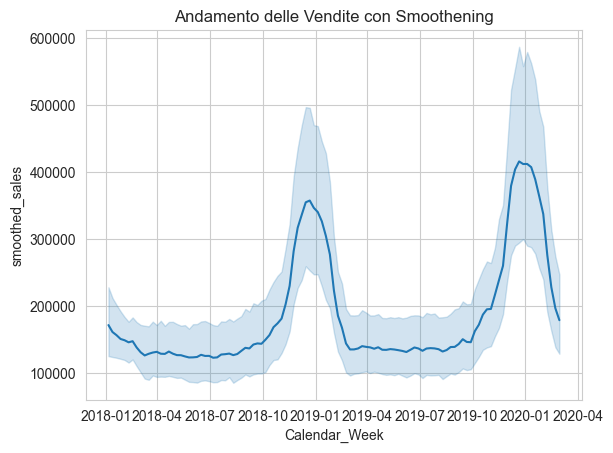

In [87]:
sns.set_style("whitegrid")
df['smoothed_sales'] = df['Sales'].rolling(window=10).mean()
sns.lineplot(x='Calendar_Week', y='smoothed_sales', data=df)
plt.title("Andamento delle Vendite con Smoothening")
plt.show()


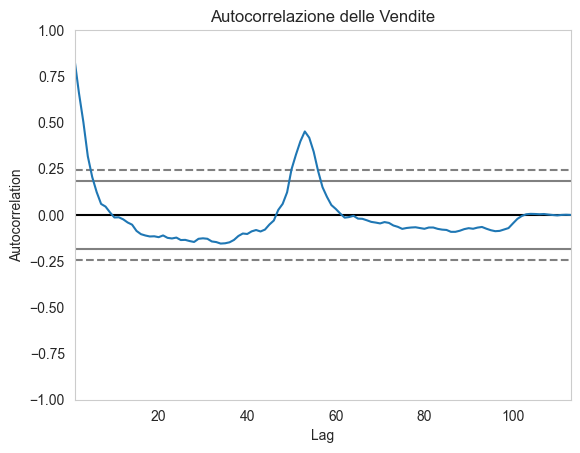

In [89]:
from pandas.plotting import autocorrelation_plot

df_grouped_time = df.groupby('Calendar_Week')['Sales'].sum()
autocorrelation_plot(df_grouped_time)
plt.title('Autocorrelazione delle Vendite')
plt.show()


In [90]:
pivot = df.pivot(index='Calendar_Week', columns='Division', values='Sales')
pivot_diff = pivot.pct_change().dropna()
pivot_diff.plot(kind='line', figsize=(12, 6))
plt.title("Variazione percentuale tra metriche successive")
plt.show()


ValueError: Index contains duplicate entries, cannot reshape

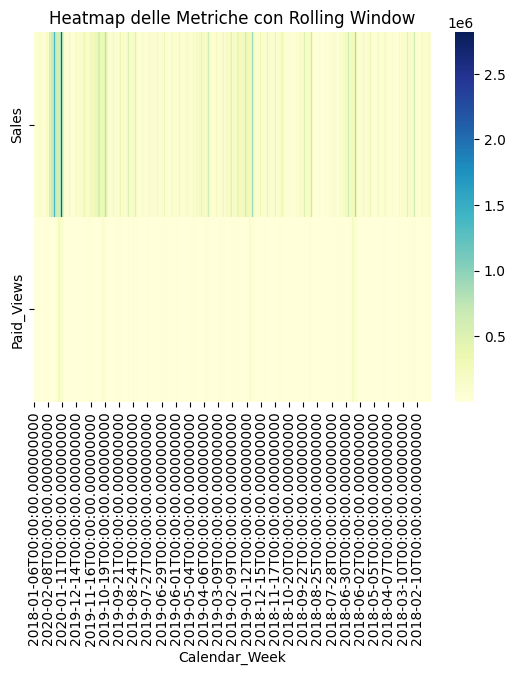

In [160]:
rolling_df = df.set_index('Calendar_Week')[['Sales', 'Paid_Views']].rolling(window=4).mean()
sns.heatmap(rolling_df.T, cmap="YlGnBu")
plt.title("Heatmap delle Metriche con Rolling Window")
plt.show()


TypeError: object of type 'ListedColormap' has no len()

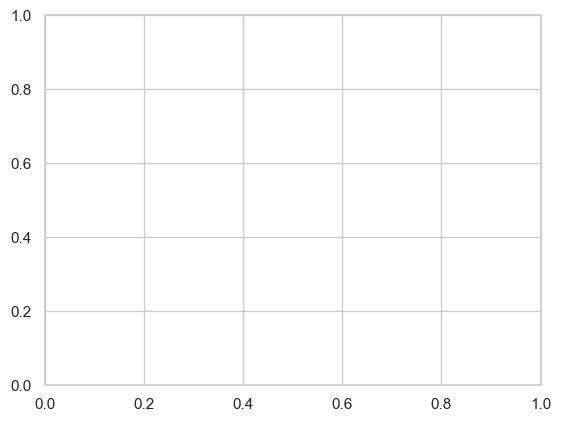

In [161]:
from pandas.plotting import parallel_coordinates

sns.set(style="whitegrid")
parallel_coordinates(df, 'Division', cols=['Paid_Views', 'Organic_Views', 'Sales'], color=plt.cm.viridis)
plt.title("Analisi Multi-Variata con Grafico Coordinate Parallele")
plt.show()


In [162]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=["Paid_Views", "Organic_Views", "Sales"]
    ),
    link=dict(
        source=[0, 1, 0],
        target=[1, 2, 2],
        value=[100, 80, 120]
    )
)])

fig.update_layout(title_text="Flussi con Sankey Diagram", font_size=10)
fig.show()


In [83]:
import plotly.express as px

fig = px.sunburst(df, path=["Division", "Month"], values="Sales")
fig.update_layout(title_text="Sunburst Diagram sulle Vendite per Divisione e Settimane")
fig.show()


In [ ]:
df.columns[2:-3]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

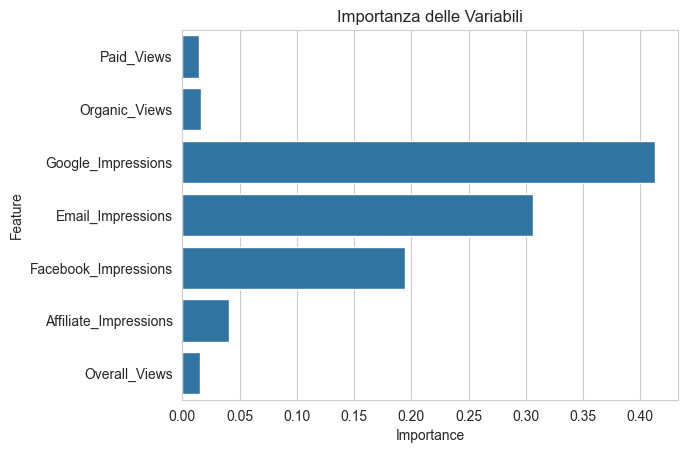

In [94]:
from sklearn.ensemble import RandomForestRegressor
#'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'
X = df[df.columns[2:9]].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()
